In [1]:
# Load necessary library
library(fs)
library("ggplot2")
library("dplyr")



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




SMBC runs beta coalescent different r/m

In [2]:
# Define base directories for the three nested directories
beta_dir1 <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r"  # Theoretical (eSMC Beta)
smbc_free_r <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/free_r"  # eSMC recombination-free directory
smbc_free_r_prior <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_4haps_beta/free_r_prior"
# List only directories in beta_dir1 that are two levels deep
beta_subdirs1 <- list.dirs(beta_dir1, recursive = TRUE, full.names = TRUE)
beta_subdirs1 <- beta_subdirs1[sapply(strsplit(beta_subdirs1, "/"), length) == length(strsplit(beta_dir1, "/")[[1]]) + 2]

# List only directories in esmc2_free that are one level deep
smbc_free_subdirs <- list.dirs(smbc_free_r, recursive = TRUE, full.names = TRUE)
smbc_free_subdirs <- smbc_free_subdirs[sapply(strsplit(smbc_free_subdirs, "/"), length) == length(strsplit(smbc_free_subdirs, "/")[[1]]) + 2]

smbc_free_prior_subdirs <- list.dirs(smbc_free_r_prior, recursive = TRUE, full.names = TRUE)
smbc_free_prior_subdirs <- smbc_free_prior_subdirs[sapply(strsplit(smbc_free_prior_subdirs, "/"), length) == length(strsplit(smbc_free_prior_subdirs, "/")[[1]]) + 2]



In [3]:
# Initialize an empty vector to store second_to_last_beta_dir values
mut_r <- c()

# Loop through each theoretical directory (beta_dir1) to extract unique `mut_r` values
for (beta_dir in beta_subdirs1) {
  # Get the second-to-last directory name (e.g., "m1e-10")
  second_last_dir <- dirname(beta_dir)  # Get the parent directory
  second_to_last_beta_dir <- basename(second_last_dir)  # Extract the second-to-last directory name
  
  # Append the second_to_last_beta_dir to mut_r
  mut_r <- c(mut_r, second_to_last_beta_dir)
}

# Ensure `mut_r` contains only unique values
mut_r <- unique(mut_r)
mut_r

[1] "m1e-6" "m1e-7" "m1e-8" "m1e-9"

In [21]:


# Initialize an empty list to store three-way matches
three_way_matches <- list()

# Loop through each unique value in `mut_r`
for (current_mut_r in mut_r) {
  
  # Find matching beta directories based on `current_mut_r`
  matching_beta_dirs <- beta_subdirs1[grepl(current_mut_r, beta_subdirs1)]
  
   # Find matching eSMC recombination-free directories based on `current_mut_r`
  matching_smbc_free_dirs <- smbc_free_subdirs[grepl(current_mut_r, smbc_free_subdirs)]
  
  # Find matching eSMC recombination-free directories based on `current_mut_r`
  matching_smbc_free_prior_dirs <- smbc_free_prior_subdirs[grepl(current_mut_r, smbc_free_prior_subdirs)]
  
  # Only add to matches if all three types of directories are found
  if (length(matching_beta_dirs) > 0 && length(matching_smbc_free_prior_dirs) > 0 && length(matching_smbc_free_dirs) > 0) {
    # Store the three-way matches for the current `mut_r`
    three_way_matches[[current_mut_r]] <- list(
      smbc_fixed_r = matching_beta_dirs,
      smbc_free_r = matching_smbc_free_dirs,
      smbc_free_prior = matching_smbc_free_prior_dirs
    )
  }
}

# Display the three-way matches
print("Three-Way Matches:")
print(three_way_matches)



[1] "Three-Way Matches:"
$`m1e-7`
$`m1e-7`$smbc_fixed_r
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.5"
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.7"
[4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.9"

$`m1e-7`$smbc_free_r
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/free_r/m1e-7/alpha1.3"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/free_r/m1e-7/alpha1.5"
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/free_r/m1e-7/alpha1.7"
[4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/free_r/m1e-7/alpha1.9"

$`m1e-7`$smbc_free_prior
[1] "/data/proj2/home/students/u.srinivasan/Plasmodi

In [8]:
# Initialize a list to store the paths of .rds and .txt files
file_matches <- list()

# Loop through each unique key in the three_way_matches list
for (key in names(three_way_matches)) {
  # Extract the directories for the current key
  smbc_fixed_r_dirs <- three_way_matches[[key]]$smbc_fixed_r
  smbc_free_r_dirs <- three_way_matches[[key]]$smbc_free_r
  smbc_free_r_prior_dirs<-three_way_matches[[key]]$smbc_free_prior
  # Find .rds and .txt files in beta_dirs
  rds_txt_files_smbc_fixed_r <- unlist(lapply(smbc_fixed_r_dirs, function(beta_dir) {
    list.files(path = smbc_fixed_r_dirs, pattern = "\\.(rds)$", full.names = TRUE)
  }))
  
    
  # Find .rds and .txt files in esmc2_free_dirs
  rds_txt_files_smbc_free_r <- unlist(lapply(smbc_free_r_dirs, function(smbc_free_r_dirs) {
    list.files(path = smbc_free_r_dirs, pattern = "\\.(rds)$", full.names = TRUE)
  }))

  # Find .rds and .txt files in esmc2_free_dirs
  rds_txt_files_smbc_free_r_prior <- unlist(lapply(smbc_free_r_prior_dirs, function(smbc_free_r_prior_dirs) {
    list.files(path = smbc_free_r_prior_dirs, pattern = "\\.(rds)$", full.names = TRUE)
  }))
  
  # Store the file paths in the structured list under the current key
  file_matches[[key]] <- list(
    smbc_fixed_r_dirs = rds_txt_files_smbc_fixed_r,
    smbc_free_r_dirs = rds_txt_files_smbc_free_r,
    smbc_free_r_prior_dirs=rds_txt_files_smbc_free_r_prior
  )
}

# Print the structured list of .rds and .txt files
print(file_matches)


$`m1e-7`
$`m1e-7`$smbc_fixed_r_dirs
  [1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x10L10000000.txt.rds"
  [2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x1L10000000.txt.rds" 
  [3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x2L10000000.txt.rds" 
  [4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x3L10000000.txt.rds" 
  [5] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x4L10000000.txt.rds" 
  [6] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x5L10000

Warning message:
“Removed 9 rows containing missing values or values outside the scale range
(`geom_line()`).”


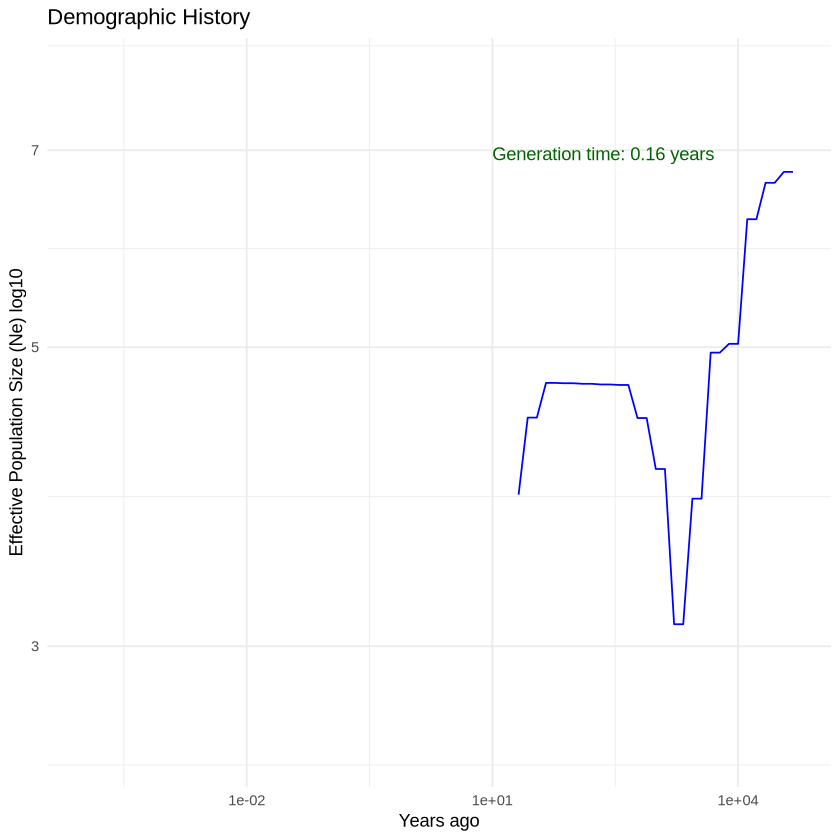

In [9]:

# Provided demography data
demography_data <- data.frame(
  years_ago = c(0.0000001, 20.90991, 27.04340, 34.97601, 45.23550, 58.50439,
                75.66543, 97.86030, 126.56557, 163.69094, 211.70625,
                273.80586, 354.12109, 457.99511, 592.33841, 766.08851,
                990.80457, 1281.43640, 1657.31899, 2143.45890, 2772.19779,
                3585.36410, 4637.05576, 5997.23919, 7756.40403, 10031.58311,
                12974.13845, 16779.83093, 21701.84380, 28067.62632, 36300.67815,
                46948.72375, 60720.15108, 78531.13893, 101566.60798, 131359.05066,
                169890.48403, 219724.30843, 284175.84417, 367532.89150),
  Ne_log10 = c(3.886466,3.886466, 4.433363, 4.433363, 4.704220, 4.704220,
               4.701291, 4.701291, 4.696954, 4.696954, 4.691536,
               4.691536, 4.687589, 4.687589, 4.430142, 4.430142,
               4.060712, 4.060712, 3.114804, 3.114804, 3.860018,
               3.860018, 4.953656, 4.953656, 5.028866, 5.028866,
               6.221847, 6.221847, 6.621246, 6.621246, 6.746056,
               6.746056, 6.872533, 6.872533, 6.957109, 6.957109,
               6.885372, 6.885372, 6.300497, 6.300497)
)

# Convert years_ago to generations_ago (assuming generation time of 0.16 years)

# Convert Ne_log10 to actual Ne values

# Plotting using ggplot2
ggplot(demography_data, aes(x = years_ago, y = Ne_log10)) +
  geom_line(color = "blue") +
  scale_x_log10(limits = c(0.0001, 50000)) +
  scale_y_log10(limits = c(2.5, 8)) +  # Adjusting y-axis limits
  labs(title = "Demographic History",
       x = "Years ago",
       y = "Effective Population Size (Ne) log10") +
  theme_minimal() +
  annotate("text", x = 10, y = max(demography_data$Ne_log10, na.rm = TRUE), 
           label = "Generation time: 0.16 years", hjust = 0, color = "darkgreen")


In [10]:
gen_times=0.16
# Initialize a master list to store all mutation data
all_mutation_data <- list()

# Process files for each mutation rate (m1e-10, m1e-06, etc.)
for (mutation_rate_index in seq_along(file_matches)) {
  mutation_rate <- names(file_matches)[mutation_rate_index]
  print(paste0("Processing mutation_rate: ", mutation_rate))

  # Extract the numeric mutation rate
  numeric_mutation_rate <- as.numeric(sub("m([0-9e.-]+)", "\\1", mutation_rate))
  print(paste("Numeric mutation rate:", numeric_mutation_rate))

  # Initialize sub-lists for 'smbc_fixed_r', 'smbc_free_r', and 'smbc_free_r_prior'
  mutation_data <- list(
    smbc_fixed_r = list(),
    smbc_free_r = list(),
    smbc_free_r_prior = list()
  )
  
  # Process 'esmc2' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_fixed_r)) {
    smbc_fixed_r_dir <- file_matches[[mutation_rate]]$smbc_fixed_r[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_fixed_r_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_fixed_r_dir)) {
      print(paste("Reading file from path:", smbc_fixed_r_dir))
      
      data_smbc_fixed_r <- readRDS(as.character(smbc_fixed_r_dir))  # Read the .rds file
      print(data_smbc_fixed_r$Xi)
      print(mean(data_smbc_fixed_r$mu / numeric_mutation_rate))

      # Perform calculations for 'esmc2'
      Ne_t <- data_smbc_fixed_r$Xi
      Ne <- mean(data_smbc_fixed_r$mu / numeric_mutation_rate)
      data_smbc_fixed_r$years_ago <- data_smbc_fixed_r$Tc * Ne * gen_times
      data_smbc_fixed_r$Ne <- log10(Ne_t * Ne)
      
      # Create a unique label
      file_base_name <- basename(smbc_fixed_r_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_fixed_r[[label]] <- data.frame(
        years_ago = data_smbc_fixed_r$years_ago,
        alpha_inf = as.numeric(data_smbc_fixed_r$alpha),
        Ne = data_smbc_fixed_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        r_m = as.numeric(data_smbc_fixed_r$rho / data_smbc_fixed_r$mu)
      )
    } else {
      warning(paste("esmc2 directory does not exist:", esmc2_dir))
    }
  }

  # Process 'smbc_free' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_free_r_dirs)) {
    smbc_free_r_dir <- file_matches[[mutation_rate]]$smbc_free_r_dirs[j]
      
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_free_r_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_free_r_dir)) {
      print(paste("Reading file from path:", smbc_free_r_dir))
      
      data_smbc_free_r <- readRDS(smbc_free_r_dir)  # Read the .rds file
      
      # Perform calculations for 'esmc2_free'
      Ne_t <- data_smbc_free_r$Xi
      Ne <- mean(data_smbc_free_r$mu / numeric_mutation_rate)
      data_smbc_free_r$years_ago <- data_smbc_free_r$Tc * Ne * gen_times
      data_smbc_free_r$Ne <- log10(Ne_t * Ne)
      
      # Create a unique label
      file_base_name <- basename(smbc_free_r_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_free_r[[label]] <- data.frame(
        years_ago = data_smbc_free_r$years_ago,
        Ne = data_smbc_free_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        alpha_inf = as.numeric(data_smbc_free_r$alpha),
        rho = as.numeric(data_smbc_free_r$rho),
        mu = as.numeric(data_smbc_free_r$mu),
        r_m = as.numeric(data_smbc_free_r$rho / data_smbc_free_r$mu)
      )
    } else {
      warning(paste("esmc2_free directory does not exist:", smbc_free_r_dir))
    }
  }

  # Process 'esmc2_free_prior' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_free_r_prior_dirs)) {
    smbc_free_prior_dir <- file_matches[[mutation_rate]]$smbc_free_r_prior_dirs[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_free_prior_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_free_prior_dir)) {
      print(paste("Reading file from path:", smbc_free_prior_dir))
      
      data_smbc_free_prior_r <- readRDS(smbc_free_prior_dir)  # Read the .rds file
      
      # Perform calculations for 'esmc2_free_prior'
      Ne_t <- data_smbc_free_prior_r$Xi
      Ne <- mean(data_smbc_free_prior_r$mu / numeric_mutation_rate)
      data_smbc_free_prior_r$years_ago <- data_smbc_free_prior_r$Tc * Ne * gen_times
      data_smbc_free_prior_r$Ne <- log10(Ne_t * Ne)
      print(data_smbc_free_prior_r$Xi)
      print(mean(data_smbc_free_prior_r$mu / numeric_mutation_rate))
      
      # Create a unique label
      file_base_name <- basename(smbc_free_prior_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_free_r_prior[[label]] <- data.frame(
        years_ago = data_smbc_free_prior_r$years_ago,
        Ne = data_smbc_free_prior_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        alpha_inf = as.numeric(data_smbc_free_prior_r$alpha),
        rho = as.numeric(data_smbc_free_prior_r$rho),
        mu = as.numeric(data_smbc_free_prior_r$mu),
        r_m = as.numeric(data_smbc_free_prior_r$rho / data_smbc_free_prior_r$mu)
      )
    } else {
      warning(paste("esmc2_free_prior directory does not exist:", smbc_free_prior_dir))
    }
  }

  # Store the results in the master list
  all_mutation_data[[mutation_rate]] <- mutation_data
    # Dynamically assign the mutation_data to a variable based on the mutation rate
  variable_name <- paste0("individual_data_frames_", gsub("-", "_", mutation_rate))
  
  # Debugging: Check the variable name and assign the mutation data
  print(paste("Assigning mutation_data to variable: ", variable_name))
  
  assign(variable_name, mutation_data)
  print(paste0("Assigned mutation data to: ", variable_name))

  print(paste0("Finished processing mutation rate: ", mutation_rate))
}

# Print final structure of all results
print(all_mutation_data)




[1] "Processing mutation_rate: m1e-7"
[1] "Numeric mutation rate: 1e-07"
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x10L10000000.txt.rds"
 [1] 1.0173588 1.0173588 1.0173588 1.0173588 0.1878488 0.1878488 0.1878488
 [8] 0.1878488 0.2492443 0.2492443 0.2492443 0.2492443 2.4746404 2.4746404
[15] 2.4746404 2.4746404 5.1746736 5.1746736 5.1746736 5.1746736 1.1869133
[22] 1.1869133 1.1869133 1.1869133 0.7215449 0.7215449 0.7215449 0.7215449
[29] 0.9077232 0.9077232 0.9077232 0.9077232 0.9585231 0.9585231 0.9585231
[36] 0.9585231 3.7884030 3.7884030 3.7884030 3.7884030
[1] 34.69836
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/fixed_r/m1e-7/alpha1.3/Tutorial_5_D_alpha1.3mu1e-07r1e-07x1L10000000.txt.rds"
 [1]  2.3857870  2.3857870  2.3857870  2.3857870  2.7087545  2.7087545
 [7]  2.7087545  2.7087545  0.4399850  0.439

In [11]:
# Extract unique alpha values from the data
alphas <- unique(unlist(lapply(individual_data_frames_m1e_7$smbc_fixed_r, function(x) unique(x$alpha_sim))))
alphas

[1] "alpha1.3" "alpha1.5" "alpha1.7" "alpha1.9"

ERROR: Error: object 'individual_data_frames_m1e_10' not found


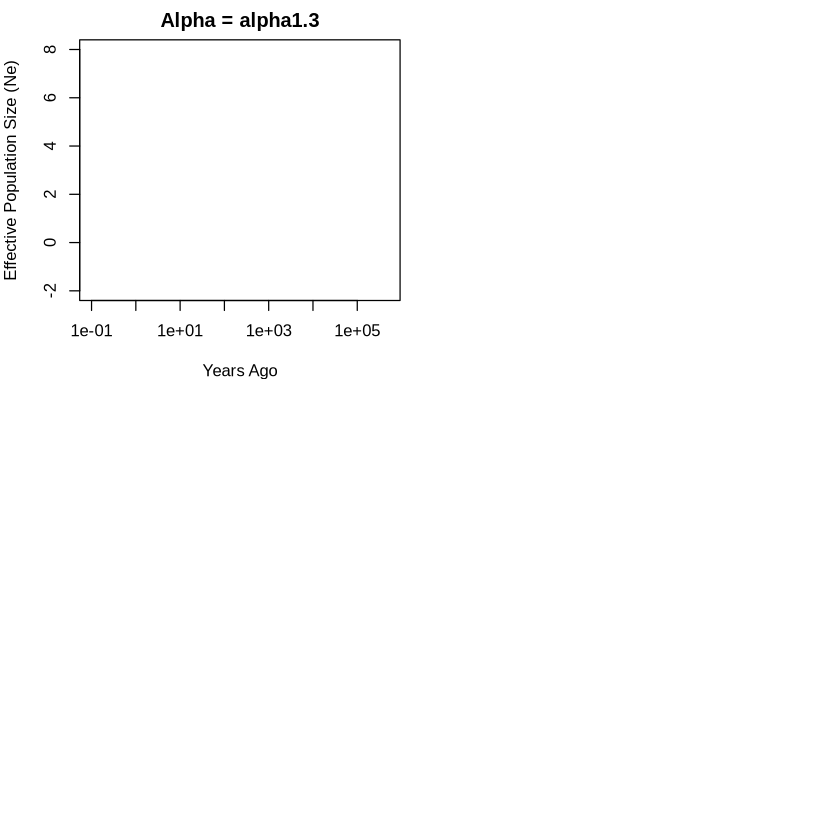

In [12]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(0.1, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_10$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_10$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_10$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_10$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_10$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_10$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago, df_free$Ne, type = "l", col = "blue")
    }
  }
  
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))


In [14]:
x<-1

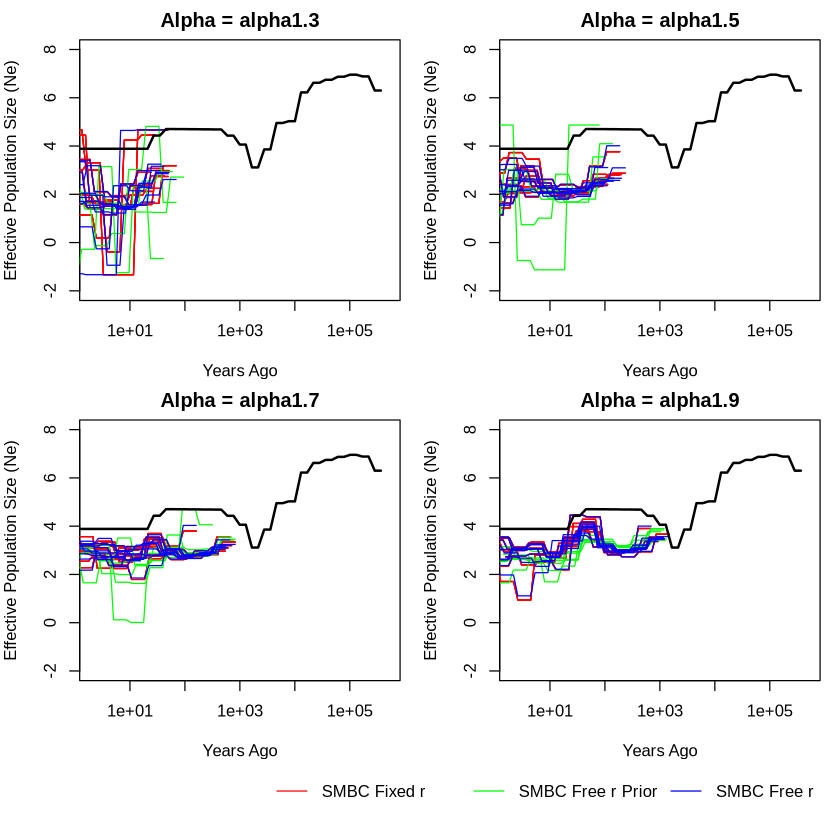

In [15]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(2, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_7$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_7$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago*x, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_7$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_7$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group

      lines(df_free_prior$years_ago*x, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_7$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_7$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago*x, df_free$Ne, type = "l", col = "blue")
    }
  }
  
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))


 [1]    0.000000    1.819727    2.179077    2.609390    3.124678    3.741723
 [7]    4.480619    5.365429    6.424966    7.693735    9.213054   11.032400
[13]   13.211020   15.819864   18.943889   22.684829   27.164512   32.528818
[19]   38.952440   46.644565   55.855692   66.885783   80.094040   95.910595
[25]  114.850521  137.530605  164.689434  197.211447  236.155739  282.790547
[31]  338.634555  405.506347  485.583632  581.474164  696.300660  833.802495
[37]  998.457479 1195.627672 1431.734011 1714.465402
 [1]    0.000000    1.819727    2.179077    2.609390    3.124678    3.741723
 [7]    4.480619    5.365429    6.424966    7.693735    9.213054   11.032400
[13]   13.211020   15.819864   18.943889   22.684829   27.164512   32.528818
[19]   38.952440   46.644565   55.855692   66.885783   80.094040   95.910595
[25]  114.850521  137.530605  164.689434  197.211447  236.155739  282.790547
[31]  338.634555  405.506347  485.583632  581.474164  696.300660  833.802495
[37]  998.457479 1195.6

 [1]    0.000000    1.205767    1.443875    1.729004    2.070439    2.479298
 [7]    2.968897    3.555180    4.257238    5.097935    6.104649    7.310164
[13]    8.753737   10.482379   12.552385   15.031165   17.999441   21.553877
[19]   25.810224   30.907093   37.010466   44.319100   53.071006   63.551192
[25]   76.100951   91.128971  109.124647  130.674015  156.478840  187.379469
[31]  224.382192  268.692021  321.751925  385.289823  461.374855  552.484763
[37]  661.586583  792.233263  948.679370 1136.019641
 [1]    0.000000    1.205767    1.443875    1.729004    2.070439    2.479298
 [7]    2.968897    3.555180    4.257238    5.097935    6.104649    7.310164
[13]    8.753737   10.482379   12.552385   15.031165   17.999441   21.553877
[19]   25.810224   30.907093   37.010466   44.319100   53.071006   63.551192
[25]   76.100951   91.128971  109.124647  130.674015  156.478840  187.379469
[31]  224.382192  268.692021  321.751925  385.289823  461.374855  552.484763
[37]  661.586583  792.2

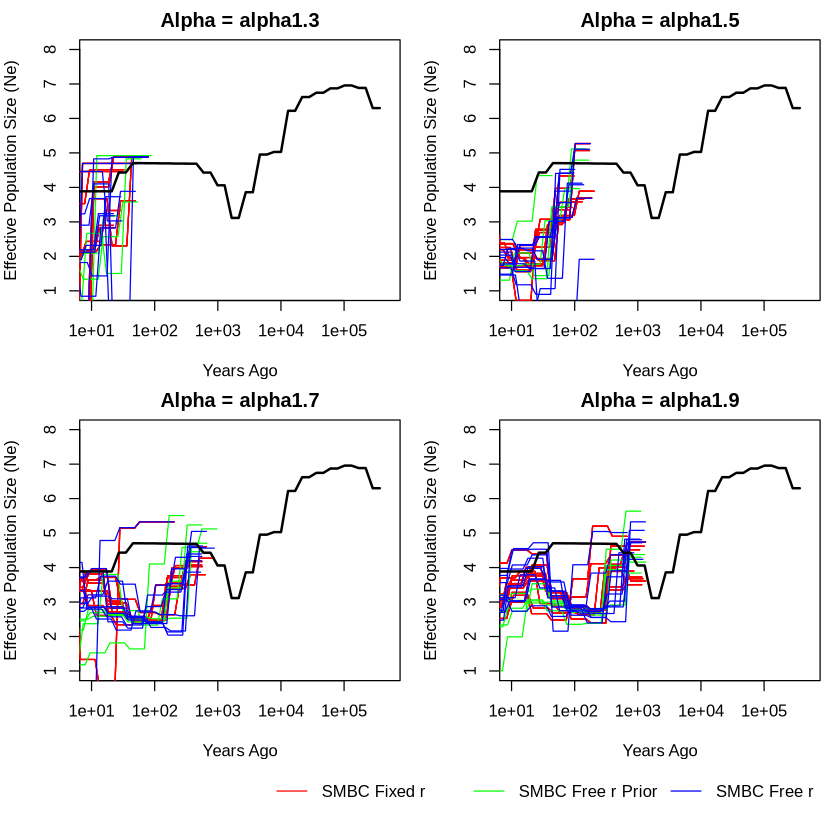

In [22]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(10, 500000), ylim = c(1, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_8$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_8$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      print(df_free_prior$years_ago*x)
      lines(df_fixed$years_ago*x, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_8$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_8$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group

      lines(df_free_prior$years_ago*x, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_8$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_8$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago*x, df_free$Ne, type = "l", col = "blue")
    }
  }
  
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))


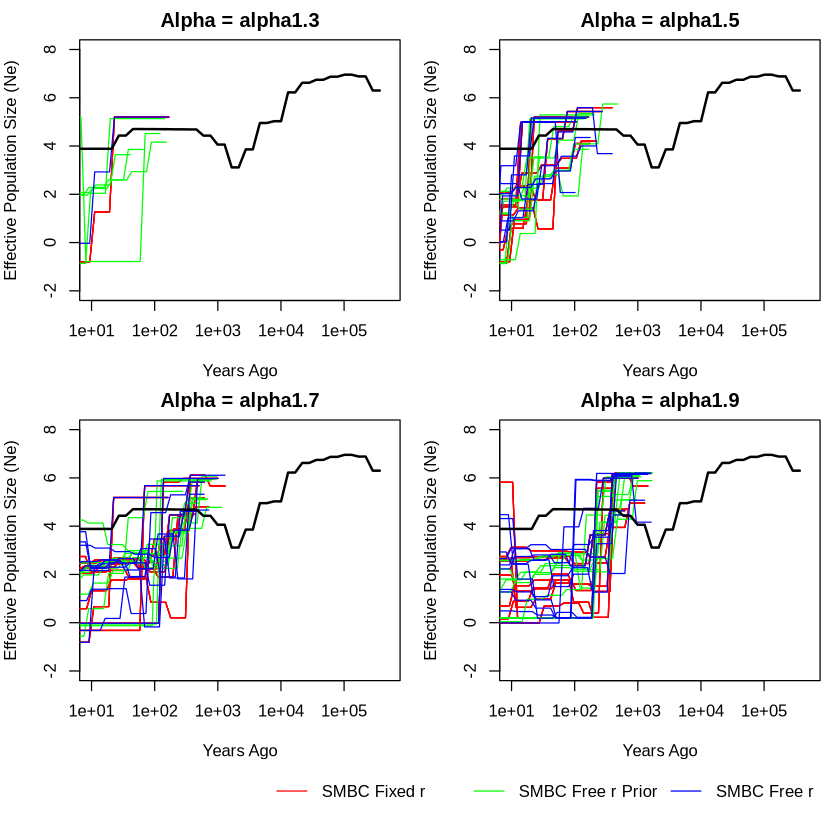

In [18]:

# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(10, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_9$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_9$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago*x, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_9$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_9$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago*x, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_9$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_9$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago*x, df_free$Ne, type = "l", col = "blue")
    }
  }
  
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))


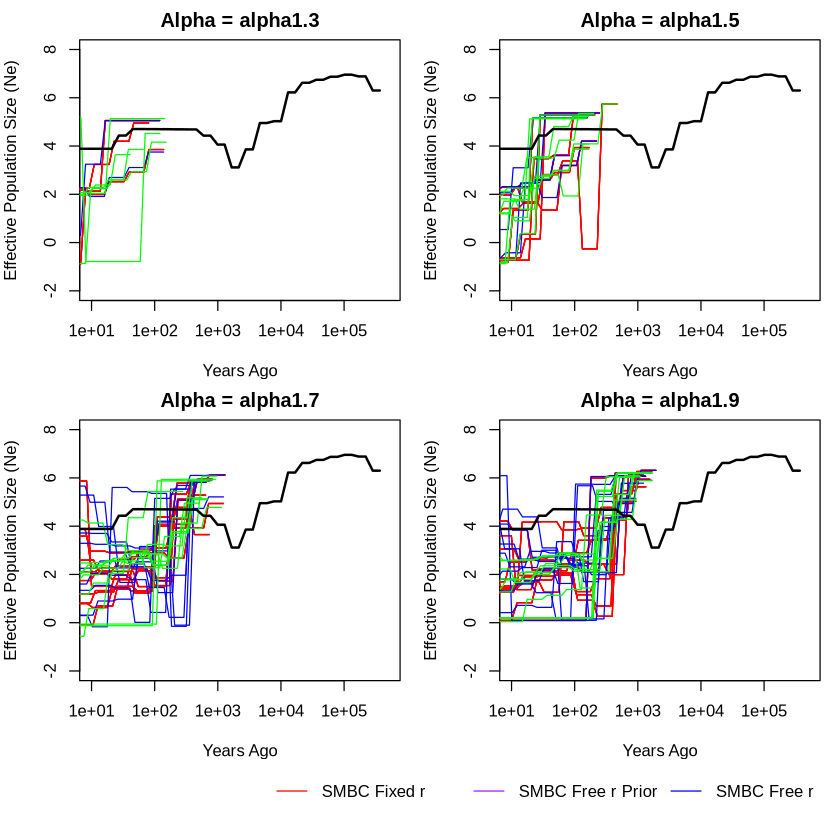

In [23]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(10, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha))
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_9$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_9$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago*x, df_fixed$Ne, type = "l", col = "red")
    }
  }
  

  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_9$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_9$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago*x, df_free$Ne, type = "l", col = "blue")
    }
  }
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_9$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_9$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago*x, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "purple", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(1, 1), bg = "white", oma = c(0, 0, 0, 0))



ERROR: Error: object 'individual_data_frames_m1e_6' not found


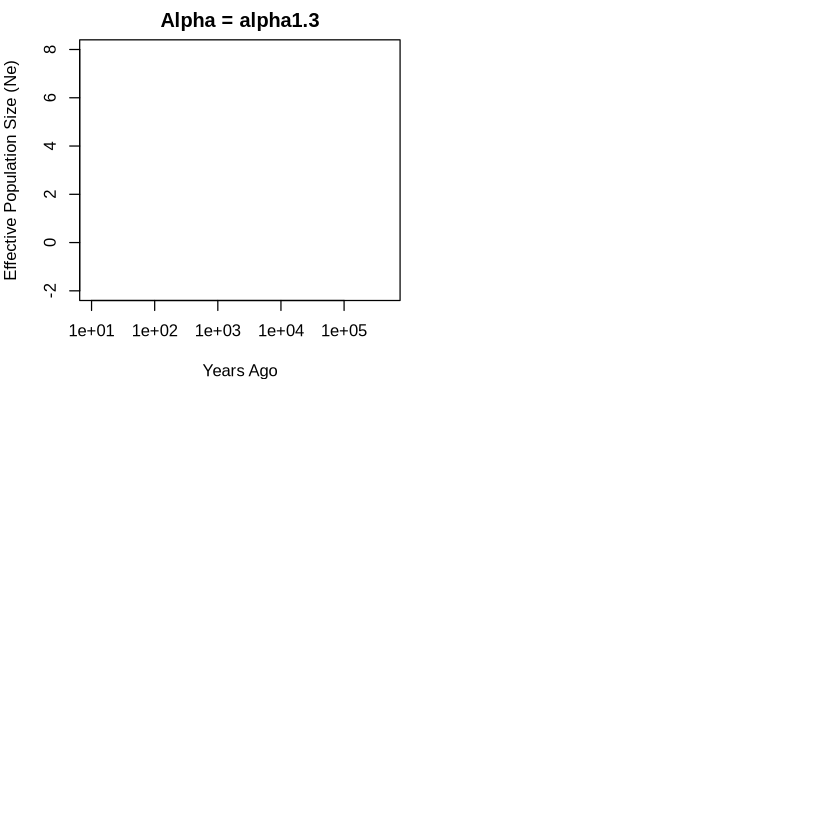

In [19]:

par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(10, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha))
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_6$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_6$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago*x, df_fixed$Ne, type = "l", col = "red")
    }
  }
  

  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_6$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_6$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago*x, df_free$Ne, type = "l", col = "blue")
    }
  }
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_6$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_6$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago*x, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  # Add the overall demography line
  lines(demography_data$years_ago, demography_data$Ne, 
        type = "l", lty = 1, col = "black", lwd = 2)
}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "purple", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(1, 1), bg = "white", oma = c(0, 0, 0, 0))



In [9]:
names(mutation_data)

[1] "smbc_fixed_r"      "smbc_free_r"       "smbc_free_r_prior"

In [24]:
# List of mutation rates and corresponding data frames
mutation_rates <- c("m1e_7", "m1e_8","m1e_9")

# Create an empty data frame to store all the data for plotting
all_data <- data.frame()

# Define different y-limits for each facet (mutation rate)
y_limits_list <- list(
  "m1e_7" = c(0, 3),
  "m1e_8" = c(0, 500)
)

# Loop through each mutation rate and process the data
for (mutation_rate in mutation_rates) {
  
  # Extract the corresponding mutation data (using the assigned variable names)
  mutation_data <- get(paste0("individual_data_frames_", mutation_rate))
  
  # Define the models to process: esmc2_free and beta_dir
  models <- c("smbc_fixed_r", "smbc_free_r", "smbc_free_r_prior")
  
  # Loop through each model and process its data
  for (model in models) {
    
    # Extract the model-specific data
    df <- mutation_data[[model]]
    
    # Check if there are any data for the model
    if (length(df) > 0) {
      # Add the mutation rate, replicate, and model info
      model_data <- bind_rows(lapply(names(df), function(rep_name) {
        data <- df[[rep_name]]
        data %>%
          mutate(
            Model = model,                  # Set model name dynamically
            MutationRate = mutation_rate,  # Add mutation rate
            Replicate = rep_name           # Add replicate name
          )
      }))
      
      # Combine model data with the all_data data frame
      all_data <- bind_rows(all_data, model_data)
    }
  }
}

# Modify the 'alpha_sim' column to remove "alpha" and keep only the numbers
all_data$alpha_sim <- gsub("alpha_", "", all_data$alpha_sim)  # Remove 'alpha_' from the label
all_data$alpha_sim <- factor(all_data$alpha_sim, levels = sort(unique(all_data$alpha_sim)))  # Sort alphas in ascending order

# Ensure MutationRate is a factor with levels in the desired order
all_data$MutationRate <- factor(all_data$MutationRate, levels = mutation_rates)

# View the structure of the data
#print(all_data)


In [25]:
all_data_unique <- all_data %>%
  group_by(Replicate, Model, MutationRate) %>%  # Group by Replicate and MutationRate
  slice_head(n = 1) %>%                  # Select the first row in each group
  ungroup()     
head(all_data_unique)


years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<fct>,<chr>,<dbl>,<dbl>
0,1.650,2.645368,alpha1.5,1,smbc_fixed_r,m1e_7,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-07r1e-07x9L10000000.txt.rds,NA,NA
0,1.950,2.923900,alpha1.5,10,smbc_fixed_r,m1e_8,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-08r1e-07x9L10000000.txt.rds,NA,NA
0,1.450,4.386104,alpha1.7,100,smbc_fixed_r,m1e_9,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x3L10000000.txt.rds,NA,NA
0,1.999,3.026056,alpha1.7,1,smbc_fixed_r,m1e_7,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07x10L10000000.txt.rds,NA,NA
0,1.999,3.521716,alpha1.7,10,smbc_fixed_r,m1e_8,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07x10L10000000.txt.rds,NA,NA
0,1.950,3.202285,alpha1.7,100,smbc_fixed_r,m1e_9,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x4L10000000.txt.rds,NA,NA


In [26]:
# Define custom labels for each mutation rate
mutation_rate_labels <- c(
  "m1e_7" = "1", 
  "m1e_8" = "10",
  "m1e_9"= "100",
  "m1e_10"= "1000"
)

# Define custom labels for models
model_labels <- c(
  "smbc_free_r" = "SMBC Free r",
  "smbc_fixed_r" = "SMBC Fixed r",
  "smbc_free_r_prior" = "SMBC Free r with accurate prior"
)

# Convert MutationRate and Model to factors with levels in the desired order
all_data_unique$MutationRate <- factor(
  all_data_unique$MutationRate,
  levels = names(mutation_rate_labels)  # Use the order defined in mutation_rate_labels
)

all_data_unique$Model <- factor(
  trimws(all_data_unique$Model),  # Remove any extra spaces
  levels = names(model_labels)  # Use the order defined in model_labels
)

# Convert alpha_sim to a factor and define its order (optional)
all_data_unique$alpha_sim <- factor(
  all_data_unique$alpha_sim, 
  levels = sort(unique(all_data_unique$alpha_sim))  # Automatically orders by unique values
)

# Remove duplicate rows: Keep the first row for each combination of Replicate, Model, and MutationRate
all_data_unique <- all_data %>%
  group_by(Replicate, Model, MutationRate) %>%
  slice_head(n = 1) %>%
  ungroup()

tail(all_data_unique)


years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<fct>,<chr>,<dbl>,<dbl>
0,1.850,3.574083,alpha1.3,65.025646,smbc_free_r,m1e_8,9_alpha1.3_Tutorial_5_D_alpha1.3mu1e-08r1e-07x8L10000000.txt.rds,4.137145e-05,6.362328e-07
0,1.850,2.705140,alpha1.5,0.991264,smbc_free_r_prior,m1e_7,9_alpha1.5_Beta_bottleneck_rep4_m1e-07_ratio1.0_rs1525229.vcf.rds,1.325536e-05,1.337218e-05
0,1.500,1.010079,alpha1.5,100.194139,smbc_free_r_prior,m1e_9,9_alpha1.5_Beta_bottleneck_rep4_m1e-09_ratio99.99999999999999_rs1525229.vcf.rds,2.260570e-05,2.256190e-07
0,1.100,5.151257,alpha1.5,100.000000,smbc_fixed_r,m1e_9,9_alpha1.5_Tutorial_5_D_alpha1.5mu1e-09r1e-07x9L10000000.txt.rds,NA,NA
0,1.100,5.151257,alpha1.5,100.000000,smbc_free_r,m1e_9,9_alpha1.5_Tutorial_5_D_alpha1.5mu1e-09r1e-07x9L10000000.txt.rds,1.416630e-05,1.416630e-07
0,1.999,2.001351,alpha1.7,96.627289,smbc_free_r_prior,m1e_8,9_alpha1.7_Beta_bottleneck_rep0_m1e-08_ratio10.0_rs1525225.vcf.rds,8.737398e-04,9.042371e-06


Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


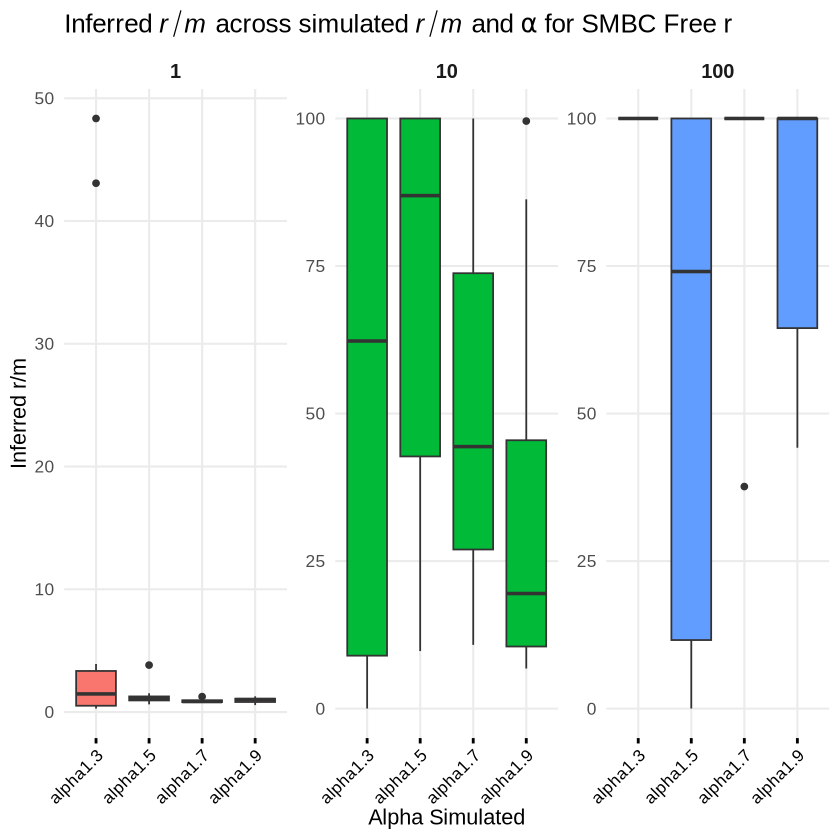

In [27]:


# Function to generate the plot for a single model
create_plot <- function(data, model_name) {
  ggplot(data, aes(x = alpha_sim, y = r_m, fill = MutationRate)) +
    geom_boxplot() +  
    facet_wrap(
      ~ MutationRate, 
      scales = "free_y", 
      nrow = 1,
      labeller = labeller(MutationRate = mutation_rate_labels)
    ) +
    labs(
      x = "Alpha Simulated",
      y = "Inferred r/m",
      fill = "Mutation Rate",
      title = bquote("Inferred " * italic(r/m) * " across simulated " * italic(r/m) * " and " * alpha * " for " * .(model_name))
    ) +
    scale_x_discrete(labels = levels(data$alpha_sim)) +  # Use factor levels for x-axis labels
    theme_minimal(base_size = 13) +
    theme(
      strip.text = element_text(size = 12, face = "bold"),
      legend.position = "none",  # No individual legends
      panel.grid.minor = element_blank(),
      axis.text.x = element_text(angle = 45, hjust = 1, color="black"),
      axis.ticks.x = element_line(size = 0.8, color="black"),
      strip.background = element_blank()
    )
}

# Create separate plots for each model
plot_esmc2 <- create_plot(subset(all_data_unique, Model == "smbc_fixed_r"), model_labels["smbc_fixed_r"])
plot_esmc2_free <- create_plot(subset(all_data_unique, Model == "smbc_free_r"), model_labels["smbc_free_r"])
plot_esmc2_prior <- create_plot(subset(all_data_unique, Model == "smbc_free_r_prior"), model_labels["smbc_free_r_prior"])

plot_esmc2_free

In [28]:
# Define custom labels for each mutation rate
mutation_rate_labels <- c(
  "m1e_7" = "1", 
  "m1e_8" = "10", 
  "m1e_9"="100", 
  "m1e_10" = "1000"
)

# Define custom labels for models
model_labels <- c(
  "smbc_fixed_r" = "SMBC Fixed r",
  "smbc_free_r" = "SMBC Free r, prior=1",
  "smbc_free_r_prior" = paste("SMBC Free r", "accurate prior",sep="\n")
)


In [29]:
all_data_unique$Model <- factor(
  all_data_unique$Model,
  levels = names(model_labels)  # Use the order defined in model_labels
)

all_data_unique

years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>
0,1.650,2.64536841,alpha1.5,1,smbc_fixed_r,m1e_7,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-07r1e-07x9L10000000.txt.rds,NA,NA
0,1.950,2.92390023,alpha1.5,10,smbc_fixed_r,m1e_8,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-08r1e-07x9L10000000.txt.rds,NA,NA
0,1.450,4.38610400,alpha1.7,100,smbc_fixed_r,m1e_9,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x3L10000000.txt.rds,NA,NA
0,1.999,3.02605579,alpha1.7,1,smbc_fixed_r,m1e_7,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07x10L10000000.txt.rds,NA,NA
0,1.999,3.52171627,alpha1.7,10,smbc_fixed_r,m1e_8,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07x10L10000000.txt.rds,NA,NA
0,1.950,3.20228456,alpha1.7,100,smbc_fixed_r,m1e_9,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x4L10000000.txt.rds,NA,NA
0,1.999,3.03186436,alpha1.7,1,smbc_fixed_r,m1e_7,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07x1L10000000.txt.rds,NA,NA
0,1.999,3.14486805,alpha1.7,10,smbc_fixed_r,m1e_8,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07x1L10000000.txt.rds,NA,NA
0,1.200,1.82400936,alpha1.7,100,smbc_fixed_r,m1e_9,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x5L10000000.txt.rds,NA,NA


In [30]:
# Convert MutationRate and Model to factors with levels in the desired order
all_data_unique$MutationRate <- factor(
  all_data_unique$MutationRate,
  levels = names(mutation_rate_labels)  # Use the order defined in mutation_rate_labels
)
all_data_unique

years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>
0,1.650,2.64536841,alpha1.5,1,smbc_fixed_r,m1e_7,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-07r1e-07x9L10000000.txt.rds,NA,NA
0,1.950,2.92390023,alpha1.5,10,smbc_fixed_r,m1e_8,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-08r1e-07x9L10000000.txt.rds,NA,NA
0,1.450,4.38610400,alpha1.7,100,smbc_fixed_r,m1e_9,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x3L10000000.txt.rds,NA,NA
0,1.999,3.02605579,alpha1.7,1,smbc_fixed_r,m1e_7,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07x10L10000000.txt.rds,NA,NA
0,1.999,3.52171627,alpha1.7,10,smbc_fixed_r,m1e_8,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07x10L10000000.txt.rds,NA,NA
0,1.950,3.20228456,alpha1.7,100,smbc_fixed_r,m1e_9,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x4L10000000.txt.rds,NA,NA
0,1.999,3.03186436,alpha1.7,1,smbc_fixed_r,m1e_7,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07x1L10000000.txt.rds,NA,NA
0,1.999,3.14486805,alpha1.7,10,smbc_fixed_r,m1e_8,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07x1L10000000.txt.rds,NA,NA
0,1.200,1.82400936,alpha1.7,100,smbc_fixed_r,m1e_9,102_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07x5L10000000.txt.rds,NA,NA


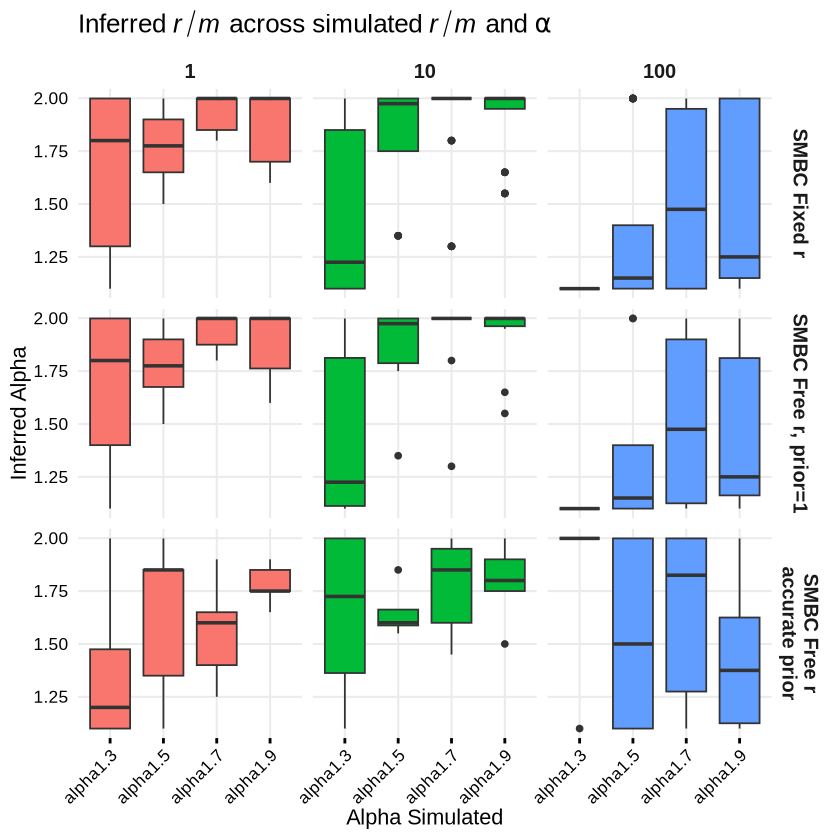

In [31]:
# Convert alpha_sim to a factor for proper ordering
all_data_unique$alpha_sim <- factor(
  all_data_unique$alpha_sim,
  levels = sort(unique(all_data_unique$alpha_sim))  # Automatically ordered
)

# Create the plot
ggplot(all_data_unique, aes(x = alpha_sim, y = alpha_inf, fill = MutationRate)) +
  geom_boxplot() +  
  facet_grid(Model ~ MutationRate, scales = "free_y", 
             labeller = labeller(
               MutationRate = mutation_rate_labels,  # Custom mutation rate labels
               Model = model_labels                 # Custom model labels
             )) +
  labs(
    x = "Alpha Simulated",
    y = "Inferred Alpha",
    fill = "Mutation Rate",
    title = bquote("Inferred " * italic(r/m) * " across simulated " * italic(r/m) * " and " * alpha)  # Fixed title
  ) +
  scale_x_discrete(labels = levels(all_data_unique$alpha_sim)) +  # Use factor levels for x-axis labels
  theme_minimal(base_size = 13) +
  theme(
    strip.text = element_text(size = 12, face = "bold"),  # Facet labels
    legend.position = "none",  # Turn off legend if not needed
    panel.grid.minor = element_blank(),  # Remove minor grid lines
    axis.text.x = element_text(angle = 45, hjust = 1, color="black"),  # Rotate x-axis labels for better readability
    axis.text.y = element_text(color="black"),
    axis.ticks.x = element_line(size = 0.8),  # Add ticks to x-axis with size
    strip.background = element_blank()  # Remove background from strip text
  )


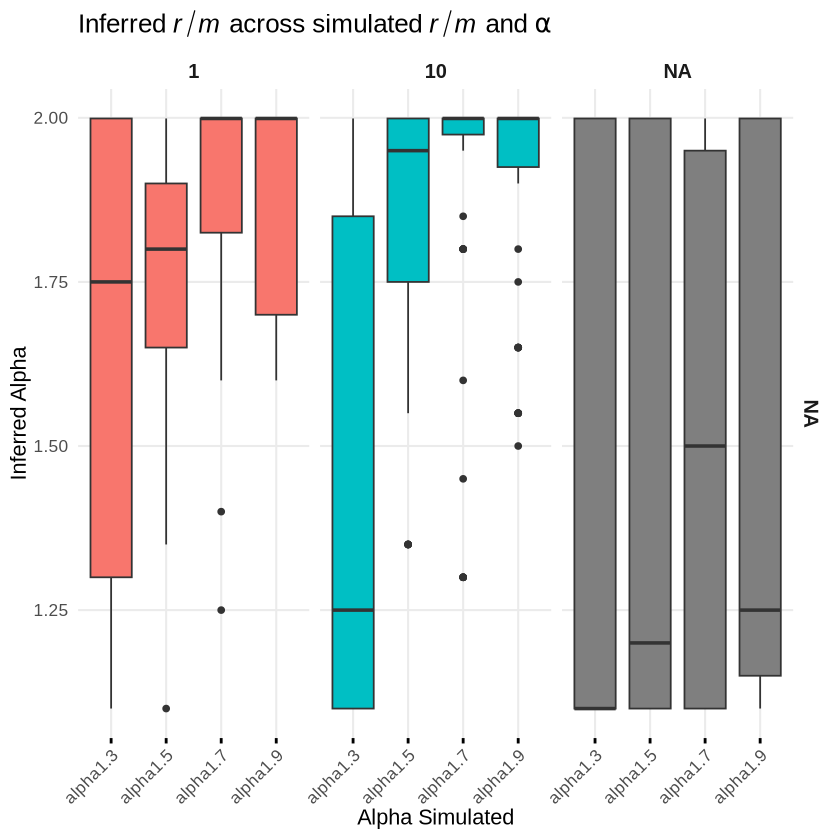

In [34]:
# Define custom labels for each mutation rate
mutation_rate_labels <- c(
  "m1e_7" = "1", 
  "m1e_8" = "10",  
  "m1e_9" = "100"
)

# Define custom labels for models
model_labels <- c(
  "esmc2" = "SMBC",
  "esmc2_free" = "SMBC Free r",
  "esmc2_free_prior" = paste("SMBC Free r", "simulated prior",sep="\n")
)

# Convert MutationRate and Model to factors with levels in the desired order
all_data_unique$MutationRate <- factor(
  all_data_unique$MutationRate,
  levels = names(mutation_rate_labels)  # Use the order defined in mutation_rate_labels
)

all_data_unique$Model <- factor(
  all_data_unique$Model,
  levels = names(model_labels)  # Use the order defined in model_labels
)

# Convert alpha_sim to a factor for proper ordering
all_data_unique$alpha_sim <- factor(
  all_data_unique$alpha_sim,
  levels = sort(unique(all_data_unique$alpha_sim))  # Automatically ordered
)

# Create the plot
ggplot(all_data_unique, aes(x = alpha_sim, y = alpha_inf, fill = MutationRate)) +
  geom_boxplot() +  
  facet_grid(Model ~ MutationRate, scales = "free_y", 
             labeller = labeller(
               MutationRate = mutation_rate_labels,  # Custom mutation rate labels
               Model = model_labels                 # Custom model labels
             )) +
  labs(
    x = "Alpha Simulated",
    y = "Inferred Alpha",
    fill = "Mutation Rate",
    title = bquote("Inferred " * italic(r/m) * " across simulated " * italic(r/m) * " and " * alpha)  # Fixed title
  ) +
  scale_x_discrete(labels = levels(all_data_unique$alpha_sim)) +  # Use factor levels for x-axis labels
  theme_minimal(base_size = 13) +
  theme(
    strip.text = element_text(size = 12, face = "bold"),  # Facet labels
    legend.position = "none",  # Turn off legend if not needed
    panel.grid.minor = element_blank(),  # Remove minor grid lines
    axis.text.x = element_text(angle = 45, hjust = 1),  # Rotate x-axis labels for better readability
    axis.ticks.x = element_line(size = 0.8),  # Add ticks to x-axis with size
    strip.background = element_blank()  # Remove background from strip text
  )


KINGMAN

In [2]:
# Define base directories for the three nested directories
kingman_fixed_r <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r"  # Theoretical (eSMC Beta)
kingman_free_r <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r"  # eSMC recombination-free directory


kingman_fixed_r_subdir <- list.dirs(kingman_fixed_r, recursive = TRUE, full.names = TRUE)
kingman_fixed_r_subdir <- kingman_fixed_r_subdir[sapply(strsplit(kingman_fixed_r_subdir, "/"), length) == length(strsplit(kingman_fixed_r, "/")[[1]]) + 1]

# List only directories in esmc2_free that are one level deep
kingman_free_r_subdir <- list.dirs(kingman_free_r, recursive = TRUE, full.names = TRUE)
kingman_free_r_subdir <- kingman_free_r_subdir[sapply(strsplit(kingman_free_r_subdir, "/"), length) == length(strsplit(kingman_free_r, "/")[[1]]) + 1]

kingman_free_r_subdir

[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r/m1e-10"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r/m1e-7" 
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r/m1e-8"

In [3]:
# Initialize an empty vector to store second_to_last_beta_dir values
mut_r <- c()

# Loop through each theoretical directory (beta_dir1)
for (kingman_r in kingman_fixed_r_subdir) {
  # Get the second-to-last directory name (e.g., "m1e-10")

  base_kingman <- basename(kingman_r)  # This gets the second-to-last directory name
  
  # Append the second_to_last_beta_dir to mut_r
  mut_r <- c(mut_r, base_kingman)
}

# Print the accumulated mut_r vector
mut_r<-unique(mut_r)
mut_r

[1] "m1e-10" "m1e-7"  "m1e-8"

In [4]:
# Initialize an empty list to store three-way matches
two_way_matches <- list()

# Loop through each unique value in `mut_r`
for (current_mut_r in mut_r) {
  
  # Find matching beta directories based on `current_mut_r`
  matching_kingman_fixed_r_subdir <- kingman_fixed_r_subdir[grepl(current_mut_r, kingman_fixed_r_subdir)]
  
   # Find matching eSMC recombination-free directories based on `current_mut_r`
  matching_kingman_free_r_subdir <- kingman_free_r_subdir[grepl(current_mut_r, kingman_free_r_subdir)]

  # Only add to matches if all three types of directories are found
  if (length(matching_kingman_fixed_r_subdir) > 0 && length(matching_kingman_free_r_subdir) > 0) {
    # Store the three-way matches for the current `mut_r`
    two_way_matches[[current_mut_r]] <- list(
      kingman_fixed_r_dirs = matching_kingman_fixed_r_subdir,
      kingman_free_r_dirs = matching_kingman_free_r_subdir
    )
  }
}

# Display the three-way matches
print("two-Way Matches:")
print(two_way_matches)

[1] "two-Way Matches:"
$`m1e-10`
$`m1e-10`$kingman_fixed_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10"

$`m1e-10`$kingman_free_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r/m1e-10"


$`m1e-7`
$`m1e-7`$kingman_fixed_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-7"

$`m1e-7`$kingman_free_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/free_r/m1e-7"


$`m1e-8`
$`m1e-8`$kingman_fixed_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-8"

$`m1e-8`$kingman_free_r_dirs
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/

In [5]:
# Initialize a list to store the paths of .rds files
file_matches <- list()

# Loop through each unique key in the three_way_matches list
for (key in names(two_way_matches)) {
  # Extract the directories for the current key
  kingman_fixed_r_dirs <- two_way_matches[[key]]$kingman_fixed_r_dirs
  kingman_free_r_dirs <- two_way_matches[[key]]$kingman_free_r_dirs

  # Find .rds files in beta_dirs
  rds_files_kingman_fixed_r <- unlist(lapply(kingman_fixed_r_dirs, function(kingman_fixed_r_dir) {
    list.files(path = kingman_fixed_r_dir, pattern = "\\.(rds)$", full.names = TRUE)
  }))
  
  # Find .rds files in esmc2_free_dirs
  rds_files_kingman_free_r <- unlist(lapply(kingman_free_r_dirs, function(kingman_free_r_dir) {
    list.files(path = kingman_free_r_dir, pattern = "\\.(rds)$", full.names = TRUE)
  }))
  

  
  # Store the file paths in the structured list under the current key
  file_matches[[key]] <- list(
    kingman_fixed_r = rds_files_kingman_fixed_r,
    kingman_free_r = rds_files_kingman_free_r
  )
}

# Print the structured list of .rds files
print(file_matches)

$`m1e-10`
$`m1e-10`$kingman_fixed_r
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10/Kingman_bottleneck_rep0_m1e-10_ratio999.9999999999999_rs1525225.vcf.rds"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10/Kingman_bottleneck_rep1_m1e-10_ratio999.9999999999999_rs1525226.vcf.rds"
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10/Kingman_bottleneck_rep3_m1e-10_ratio999.9999999999999_rs1525228.vcf.rds"
[4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10/Kingman_bottleneck_rep4_m1e-10_ratio999.9999999999999_rs1525229.vcf.rds"
[5] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/s

In [9]:
gen_times=0.16
# Initialize a master list to store all mutation data
all_mutation_data <- list()

# Process files for each mutation rate (m1e-10, m1e-06, etc.)
for (mutation_rate_index in seq_along(file_matches)) {
  mutation_rate <- names(file_matches)[mutation_rate_index]
  print(paste0("Processing mutation_rate: ", mutation_rate))

  # Extract the numeric mutation rate
  numeric_mutation_rate <- as.numeric(sub("m([0-9e.-]+)", "\\1", mutation_rate))
  print(paste("Numeric mutation rate:", numeric_mutation_rate))

  # Initialize sub-lists for 'esmc2', 'esmc2_free', and 'esmc2_free_prior'
  mutation_data <- list(
   smbc_fixed_r=list(),
   smbc_free_r=list()
  )
  
  # Process 'esmc2' files
  for (j in seq_along(file_matches[[mutation_rate]]$kingman_fixed_r)) {
    smbc_dir <- file_matches[[mutation_rate]]$kingman_fixed_r[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_dir)) {
      print(paste("Reading file from path:", smbc_dir))
      
      data_smbc <- readRDS(as.character(smbc_dir))  # Read the .rds file
      print(data_smbc$Xi)
      print(mean(data_smbc$mu / numeric_mutation_rate))

      # Perform calculations for 'esmc2'
      Ne_t <- data_smbc$Xi
      Ne <- mean(data_smbc$mu / numeric_mutation_rate)
      data_smbc$years_ago <- data_smbc$Tc * Ne * gen_times
      data_smbc$Ne <- log10(Ne_t * Ne)
      
      # Create a unique label
      file_base_name <- basename(smbc_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_fixed_r[[label]] <- data.frame(
        years_ago = data_smbc$years_ago,
        alpha_inf = as.numeric(data_smbc$alpha),
        Ne = data_smbc$Ne,
        alpha_sim = as.character(alpha_simmed),
        r_m = as.numeric(data_smbc$rho / data_smbc$mu)
      )
    } else {
      warning(paste("esmc2 directory does not exist:", smbc_dir))
    }
  }

  # Process 'esmc2_free_prior' files
  for (j in seq_along(file_matches[[mutation_rate]]$kingman_free_r)) {
    smbc_free_prior_dir <- file_matches[[mutation_rate]]$kingman_free_r[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_free_prior_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_free_prior_dir)) {
      print(paste("Reading file from path:", smbc_free_prior_dir))
      
      data_smbc_free_prior <- readRDS(smbc_free_prior_dir)  # Read the .rds file
      
      # Perform calculations for 'esmc2_free_prior'
      Ne_t <- data_smbc_free_prior$Xi
      Ne <- mean(data_smbc_free_prior$mu / numeric_mutation_rate)
      data_smbc_free_prior$years_ago <- data_smbc_free_prior$Tc * Ne * gen_times
      data_smbc_free_prior$Ne <- log10(Ne_t * Ne)
      print(data_smbc_free_prior$Xi)
      print(mean(data_smbc_free_prior$mu / numeric_mutation_rate))
      
      # Create a unique label
      file_base_name <- basename(smbc_free_prior_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_free_r[[label]] <- data.frame(
        years_ago = data_smbc_free_prior$years_ago,
        Ne = data_smbc_free_prior$Ne,
        alpha_sim = as.character(alpha_simmed),
        alpha_inf = as.numeric(data_smbc_free_prior$alpha),
        rho = as.numeric(data_smbc_free_prior$rho),
        mu = as.numeric(data_smbc_free_prior$mu),
        r_m = as.numeric(data_smbc_free_prior$rho / data_smbc_free_prior$mu)
      )
    } else {
      warning(paste("esmc2_free_prior directory does not exist:", esmc2_free_prior_dir))
    }
  }

  # Store the results in the master list
  all_mutation_data[[mutation_rate]] <- mutation_data
    # Dynamically assign the mutation_data to a variable based on the mutation rate
  variable_name <- paste0("individual_data_frames_", gsub("-", "_", mutation_rate))
  
  # Debugging: Check the variable name and assign the mutation data
  print(paste("Assigning mutation_data to variable: ", variable_name))
  
  assign(variable_name, mutation_data)
  print(paste0("Assigned mutation data to: ", variable_name))

  print(paste0("Finished processing mutation rate: ", mutation_rate))
}

# Print final structure of all results
print(all_mutation_data)



[1] "Processing mutation_rate: m1e-10"
[1] "Numeric mutation rate: 1e-10"
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/SMBC_outs/smbc_6haps_kingman/fixed_r/m1e-10/Kingman_bottleneck_rep0_m1e-10_ratio999.9999999999999_rs1525225.vcf.rds"
 [1]   43.8380923   43.8380923   43.8380923   43.8380923    3.2854765
 [6]    3.2854765    3.2854765    3.2854765    0.7592846    0.7592846
[11]    0.7592846    0.7592846    0.3146706    0.3146706    0.3146706
[16]    0.3146706    0.3244825    0.3244825    0.3244825    0.3244825
[21]    0.3924434    0.3924434    0.3924434    0.3924434    0.3292908
[26]    0.3292908    0.3292908    0.3292908    0.1797879    0.1797879
[31]    0.1797879    0.1797879   13.9968819   13.9968819   13.9968819
[36]   13.9968819 1000.0000000 1000.0000000 1000.0000000 1000.0000000
[1] 9424.516
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC

In [10]:
names(individual_data_frames_m1e_10$smbc_fixed_r)

[1] "1_m1e-10_Kingman_bottleneck_rep0_m1e-10_ratio999.9999999999999_rs1525225.vcf.rds"
[2] "2_m1e-10_Kingman_bottleneck_rep1_m1e-10_ratio999.9999999999999_rs1525226.vcf.rds"
[3] "3_m1e-10_Kingman_bottleneck_rep3_m1e-10_ratio999.9999999999999_rs1525228.vcf.rds"
[4] "4_m1e-10_Kingman_bottleneck_rep4_m1e-10_ratio999.9999999999999_rs1525229.vcf.rds"
[5] "5_m1e-10_Kingman_bottleneck_rep5_m1e-10_ratio999.9999999999999_rs1525230.vcf.rds"
[6] "6_m1e-10_Kingman_bottleneck_rep6_m1e-10_ratio999.9999999999999_rs1525231.vcf.rds"
[7] "7_m1e-10_Kingman_bottleneck_rep7_m1e-10_ratio999.9999999999999_rs1525232.vcf.rds"
[8] "8_m1e-10_Kingman_bottleneck_rep8_m1e-10_ratio999.9999999999999_rs1525233.vcf.rds"
[9] "9_m1e-10_Kingman_bottleneck_rep9_m1e-10_ratio999.9999999999999_rs1525234.vcf.rds"

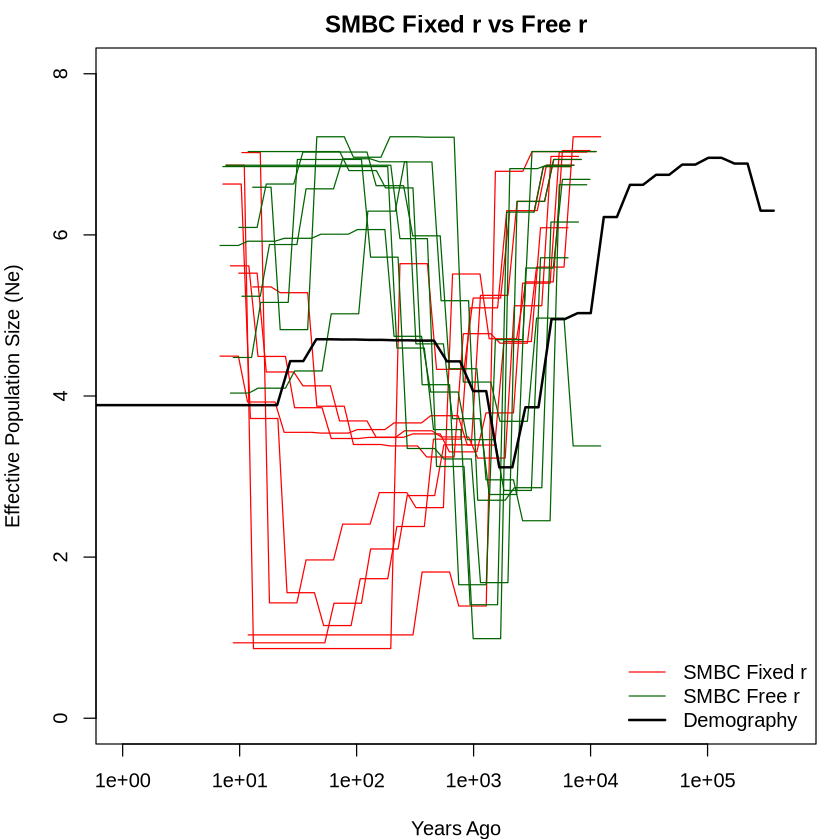

In [14]:
# Set global plotting parameters (optional)
par(mfrow = c(1, 1), mar = c(4, 4, 2, 1), bg = "white")

# Create a new plot
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = paste("SMBC Fixed r vs Free r"), col = "blue")

# Loop through the individual_data_frames_m1e_10$smbc_fixed_r
for (group_name in names(individual_data_frames_m1e_10$smbc_fixed_r)) {
  # Extract the data frame
  df_fixed <- individual_data_frames_m1e_10$smbc_fixed_r[[group_name]]
  
  # Add the line for this group
  lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
}

# Loop through the individual_data_frames_m1e_10$smbc_free_r
for (group_name in names(individual_data_frames_m1e_10$smbc_free_r)) {
  # Extract the data frame
  df_free <- individual_data_frames_m1e_10$smbc_free_r[[group_name]]
  
  # Add the line for this group
  lines(df_free$years_ago, df_free$Ne, type = "l", col = "darkgreen")
}

# Add the overall demography line
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend
legend("bottomright", 
       legend = c("SMBC Fixed r", "SMBC Free r", "Demography"), 
       col = c("red", "darkgreen", "black"), 
       lty = c(1, 1, 1), 
       lwd = c(1, 1, 2), 
       bty = "n")  # "bty = 'n'" removes the legend box

# Reset plotting parameters to default (optional)
par(mfrow = c(1, 1), bg = "white")


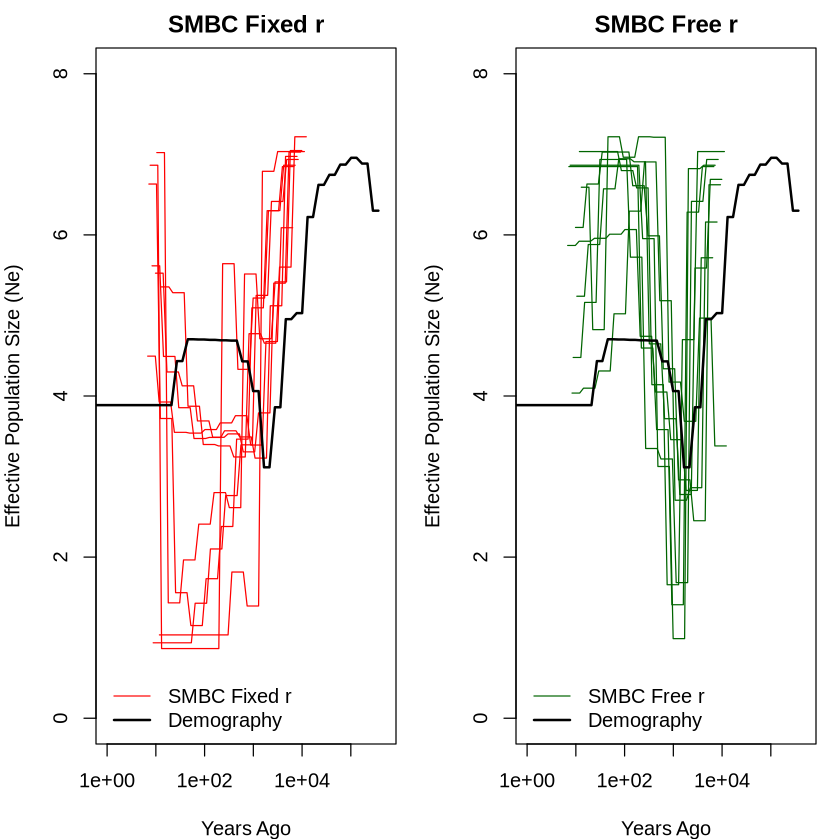

In [15]:
# Set global plotting parameters to create two subplots (2 rows, 1 column)
par(mfrow = c(1, 2), mar = c(4, 4, 2, 1), bg = "white")

# First subplot: SMBC Fixed r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Fixed r", col = "red")

# Loop through the individual_data_frames_m1e_10$smbc_fixed_r
for (group_name in names(individual_data_frames_m1e_10$smbc_fixed_r)) {
  # Extract the data frame
  df_fixed <- individual_data_frames_m1e_10$smbc_fixed_r[[group_name]]
  
  # Add the line for this group
  lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
}

# Add the overall demography line to the first plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the first plot
legend("bottomleft", 
       legend = c("SMBC Fixed r", "Demography"), 
       col = c("red", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Second subplot: SMBC Free r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Free r", col = "darkgreen")

# Loop through the individual_data_frames_m1e_10$smbc_free_r
for (group_name in names(individual_data_frames_m1e_10$smbc_free_r)) {
  # Extract the data frame
  df_free <- individual_data_frames_m1e_10$smbc_free_r[[group_name]]
  
  # Add the line for this group
  lines(df_free$years_ago, df_free$Ne, type = "l", col = "darkgreen")
}

# Add the overall demography line to the second plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the second plot
legend("bottomleft", 
       legend = c("SMBC Free r", "Demography"), 
       col = c("darkgreen", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Reset plotting parameters to default (optional)
par(mfrow = c(1, 2), bg = "white")


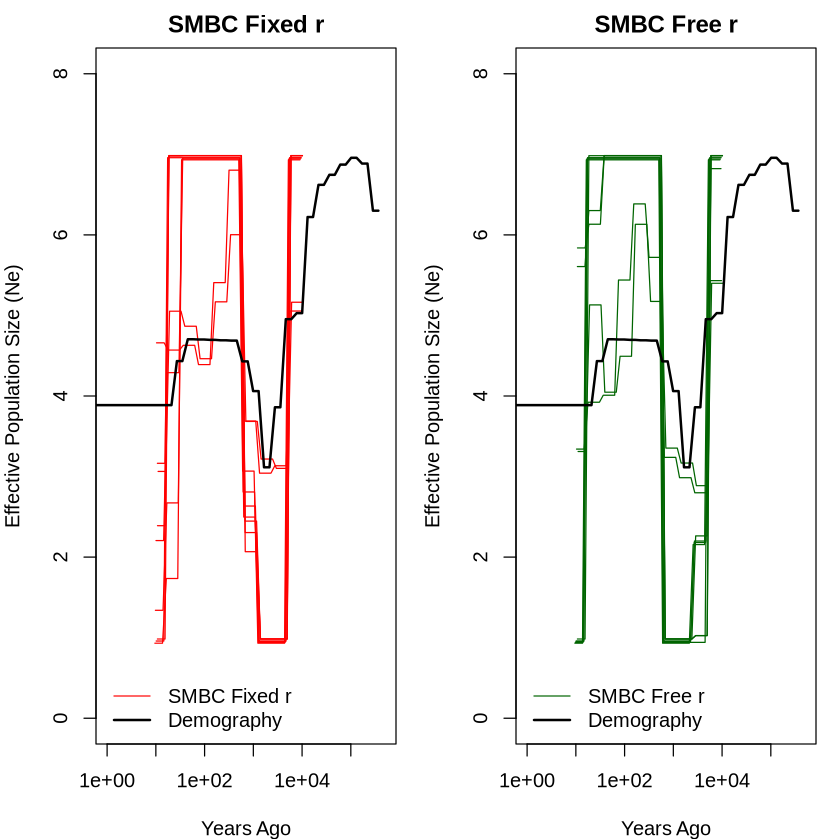

In [16]:

# Set global plotting parameters to create two subplots (2 rows, 1 column)
par(mfrow = c(1, 2), mar = c(4, 4, 2, 1), bg = "white")

# First subplot: SMBC Fixed r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Fixed r", col = "red")

# Loop through the individual_data_frames_m1e_10$smbc_fixed_r
for (group_name in names(individual_data_frames_m1e_7$smbc_fixed_r)) {
  # Extract the data frame
  df_fixed <- individual_data_frames_m1e_7$smbc_fixed_r[[group_name]]
  
  # Add the line for this group
  lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
}

# Add the overall demography line to the first plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the first plot
legend("bottomleft", 
       legend = c("SMBC Fixed r", "Demography"), 
       col = c("red", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Second subplot: SMBC Free r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Free r", col = "darkgreen")

# Loop through the individual_data_frames_m1e_10$smbc_free_r
for (group_name in names(individual_data_frames_m1e_7$smbc_free_r)) {
  # Extract the data frame
  df_free <- individual_data_frames_m1e_7$smbc_free_r[[group_name]]
  
  # Add the line for this group
  lines(df_free$years_ago, df_free$Ne, type = "l", col = "darkgreen")
}

# Add the overall demography line to the second plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the second plot
legend("bottomleft", 
       legend = c("SMBC Free r", "Demography"), 
       col = c("darkgreen", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Reset plotting parameters to default (optional)
par(mfrow = c(1, 2), bg = "white")

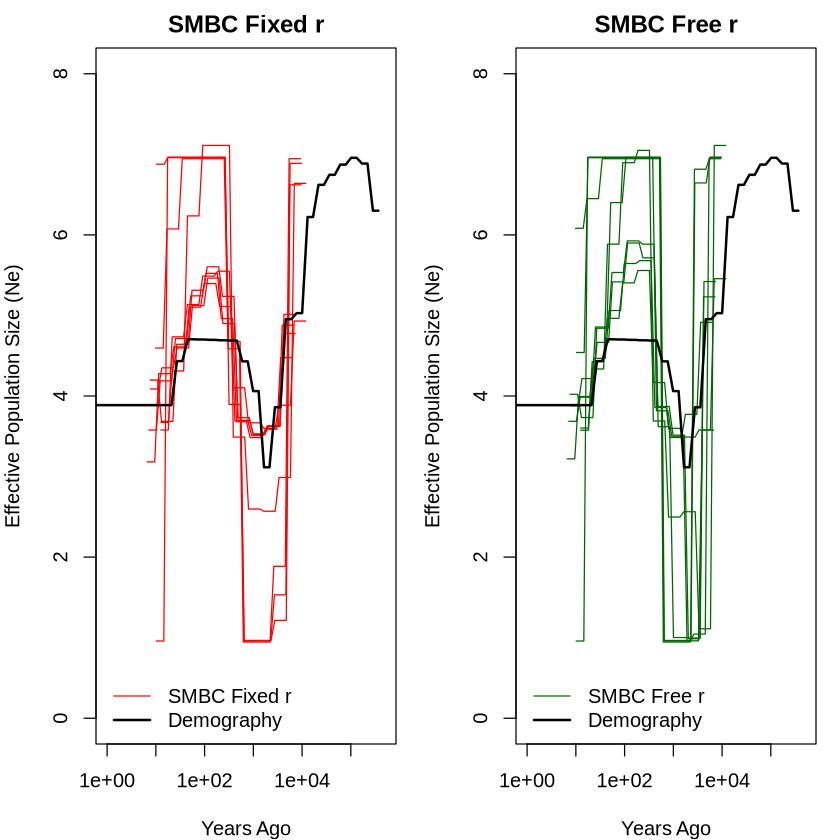

In [17]:

# Set global plotting parameters to create two subplots (2 rows, 1 column)
par(mfrow = c(1, 2), mar = c(4, 4, 2, 1), bg = "white")

# First subplot: SMBC Fixed r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Fixed r", col = "red")

# Loop through the individual_data_frames_m1e_10$smbc_fixed_r
for (group_name in names(individual_data_frames_m1e_8$smbc_fixed_r)) {
  # Extract the data frame
  df_fixed <- individual_data_frames_m1e_8$smbc_fixed_r[[group_name]]
  
  # Add the line for this group
  lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
}

# Add the overall demography line to the first plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the first plot
legend("bottomleft", 
       legend = c("SMBC Fixed r", "Demography"), 
       col = c("red", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Second subplot: SMBC Free r
plot(NULL, xlim = c(1, 500000), ylim = c(0, 8),
     log = "x", # Log-transform the x-axis
     xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
     main = "SMBC Free r", col = "darkgreen")

# Loop through the individual_data_frames_m1e_10$smbc_free_r
for (group_name in names(individual_data_frames_m1e_8$smbc_free_r)) {
  # Extract the data frame
  df_free <- individual_data_frames_m1e_8$smbc_free_r[[group_name]]
  
  # Add the line for this group
  lines(df_free$years_ago, df_free$Ne, type = "l", col = "darkgreen")
}

# Add the overall demography line to the second plot
lines(demography_data$years_ago, demography_data$Ne, 
      type = "l", lty = 1, col = "black", lwd = 2)

# Add a legend to the second plot
legend("bottomleft", 
       legend = c("SMBC Free r", "Demography"), 
       col = c("darkgreen", "black"), 
       lty = c(1, 1), 
       lwd = c(1, 2), 
       bty = "n")

# Reset plotting parameters to default (optional)
par(mfrow = c(1, 2), bg = "white")

Beta Constant popsize

In [4]:
# Define base directories for the three nested directories

beta_dir1 <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r"  # Theoretical (eSMC Beta)
smbc_free_r <- "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/free_r"  # eSMC recombination-free directory

# List only directories in beta_dir1 that are two levels deep
beta_subdirs1 <- list.dirs(beta_dir1, recursive = TRUE, full.names = TRUE)
beta_subdirs1 <- beta_subdirs1[sapply(strsplit(beta_subdirs1, "/"), length) == length(strsplit(beta_dir1, "/")[[1]]) + 2]

# List only directories in esmc2_free that are one level deep
smbc_free_subdirs <- list.dirs(smbc_free_r, recursive = TRUE, full.names = TRUE)
smbc_free_subdirs <- smbc_free_subdirs[sapply(strsplit(smbc_free_subdirs, "/"), length) == length(strsplit(smbc_free_subdirs, "/")[[1]]) + 2]




In [5]:
# Initialize an empty vector to store second_to_last_beta_dir values
mut_r <- c()

# Loop through each theoretical directory (beta_dir1) to extract unique `mut_r` values
for (beta_dir in beta_subdirs1) {
  # Get the second-to-last directory name (e.g., "m1e-10")
  second_last_dir <- dirname(beta_dir)  # Get the parent directory
  second_to_last_beta_dir <- basename(second_last_dir)  # Extract the second-to-last directory name
  
  # Append the second_to_last_beta_dir to mut_r
  mut_r <- c(mut_r, second_to_last_beta_dir)
}

# Ensure `mut_r` contains only unique values
mut_r <- unique(mut_r)
mut_r

[1] "m1e-06" "m1e-07" "m1e-08" "m1e-09"

In [6]:


# Initialize an empty list to store three-way matches
two_way_matches <- list()

# Loop through each unique value in `mut_r`
for (current_mut_r in mut_r) {
  
  # Find matching beta directories based on `current_mut_r`
  matching_beta_dirs <- beta_subdirs1[grepl(current_mut_r, beta_subdirs1)]
  
   # Find matching eSMC recombination-free directories based on `current_mut_r`
  matching_smbc_free_dirs <- smbc_free_subdirs[grepl(current_mut_r, smbc_free_subdirs)]
  

  # Only add to matches if all three types of directories are found
  if (length(matching_beta_dirs) > 0 && length(matching_smbc_free_dirs) > 0) {
    # Store the three-way matches for the current `mut_r`
    two_way_matches[[current_mut_r]] <- list(
      smbc_fixed_r = matching_beta_dirs,
      smbc_free_r = matching_smbc_free_dirs

    )
  }
}

# Display the three-way matches
print("two-Way Matches:")
print(two_way_matches)


[1] "two-Way Matches:"
$`m1e-06`
$`m1e-06`$smbc_fixed_r
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.5"
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.7"
[4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.9"

$`m1e-06`$smbc_free_r
[1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/free_r/m1e-06/alpha1.3"
[2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/free_r/m1e-06/alpha1.5"
[3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/free_r/m1e-06/alpha1.7"
[4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/free_r/m1e-06/alpha1.9"


$`m1e-07`
$`m1e-07`

In [7]:
# Initialize a list to store the paths of .rds and .txt files
file_matches <- list()

# Loop through each unique key in the three_way_matches list
for (key in names(two_way_matches)) {
  # Extract the directories for the current key
  smbc_fixed_r_dirs <- two_way_matches[[key]]$smbc_fixed_r
  smbc_free_r_dirs <- two_way_matches[[key]]$smbc_free_r
  # Find .rds and .txt files in beta_dirs
  rds_txt_files_smbc_fixed_r <- unlist(lapply(smbc_fixed_r_dirs, function(beta_dir) {
    list.files(path = smbc_fixed_r_dirs, pattern = "\\.(rds)$", full.names = TRUE)
  }))
  
    
  # Find .rds and .txt files in esmc2_free_dirs
  rds_txt_files_smbc_free_r <- unlist(lapply(smbc_free_r_dirs, function(smbc_free_r_dirs) {
    list.files(path = smbc_free_r_dirs, pattern = "\\.(rds)$", full.names = TRUE)
  }))


  # Store the file paths in the structured list under the current key
  file_matches[[key]] <- list(
    smbc_fixed_r_dirs = rds_txt_files_smbc_fixed_r,
    smbc_free_r_dirs = rds_txt_files_smbc_free_r
  )
}

# Print the structured list of .rds and .txt files
print(file_matches)


$`m1e-06`
$`m1e-06`$smbc_fixed_r_dirs
  [1] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x10L10000000.txt.rds"
  [2] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x1L10000000.txt.rds" 
  [3] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x2L10000000.txt.rds" 
  [4] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x3L10000000.txt.rds" 
  [5] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x4L10000000.txt.rds" 
  [6] "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/mspri

In [8]:
gen_times=1.6
# Initialize a master list to store all mutation data
all_mutation_data <- list()

# Process files for each mutation rate (m1e-10, m1e-06, etc.)
for (mutation_rate_index in seq_along(file_matches)) {
  mutation_rate <- names(file_matches)[mutation_rate_index]
  print(paste0("Processing mutation_rate: ", mutation_rate))

  # Extract the numeric mutation rate
  numeric_mutation_rate <- as.numeric(sub("m([0-9e.-]+)", "\\1", mutation_rate))
  print(paste("Numeric mutation rate:", numeric_mutation_rate))

  # Initialize sub-lists for 'smbc_fixed_r', 'smbc_free_r', and 'smbc_free_r_prior'
  mutation_data <- list(
    smbc_fixed_r = list(),
    smbc_free_r = list(),
    smbc_free_r_prior = list()
  )
  
  # Process 'esmc2' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_fixed_r)) {
    smbc_fixed_r_dir <- file_matches[[mutation_rate]]$smbc_fixed_r[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_fixed_r_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_fixed_r_dir)) {
      print(paste("Reading file from path:", smbc_fixed_r_dir))
      
      data_smbc_fixed_r <- readRDS(as.character(smbc_fixed_r_dir))  # Read the .rds file
      print(data_smbc_fixed_r$Xi)
      print(mean(data_smbc_fixed_r$mu / numeric_mutation_rate))

      # Perform calculations for 'esmc2'
      Ne_t <- data_smbc_fixed_r$Xi
      Ne <- mean(data_smbc_fixed_r$mu / numeric_mutation_rate)
      data_smbc_fixed_r$years_ago <- data_smbc_fixed_r$Tc * Ne * gen_times
      data_smbc_fixed_r$Ne <- log10(Ne_t * Ne)
      
      # Create a unique label
      file_base_name <- basename(smbc_fixed_r_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_fixed_r[[label]] <- data.frame(
        years_ago = data_smbc_fixed_r$years_ago,
        alpha_inf = as.numeric(data_smbc_fixed_r$alpha),
        Ne = data_smbc_fixed_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        r_m = as.numeric(data_smbc_fixed_r$rho / data_smbc_fixed_r$mu)
      )
    } else {
      warning(paste("esmc2 directory does not exist:", esmc2_dir))
    }
  }

  # Process 'smbc_free' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_free_r_dirs)) {
    smbc_free_r_dir <- file_matches[[mutation_rate]]$smbc_free_r_dirs[j]
      
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_free_r_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_free_r_dir)) {
      print(paste("Reading file from path:", smbc_free_r_dir))
      
      data_smbc_free_r <- readRDS(smbc_free_r_dir)  # Read the .rds file
      
      # Perform calculations for 'esmc2_free'
      Ne_t <- data_smbc_free_r$Xi
      Ne <- mean(data_smbc_free_r$mu / numeric_mutation_rate)
      data_smbc_free_r$years_ago <- data_smbc_free_r$Tc * Ne * gen_times
      data_smbc_free_r$Ne <- log10(Ne_t * Ne)
      
      # Create a unique label
      file_base_name <- basename(smbc_free_r_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_free_r[[label]] <- data.frame(
        years_ago = data_smbc_free_r$years_ago,
        Ne = data_smbc_free_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        alpha_inf = as.numeric(data_smbc_free_r$alpha),
        rho = as.numeric(data_smbc_free_r$rho),
        mu = as.numeric(data_smbc_free_r$mu),
        r_m = as.numeric(data_smbc_free_r$rho / data_smbc_free_r$mu)
      )
    } else {
      warning(paste("esmc2_free directory does not exist:", smbc_free_r_dir))
    }
  }

  # Process 'esmc2_free_prior' files
  for (j in seq_along(file_matches[[mutation_rate]]$smbc_free_r_prior_dirs)) {
    smbc_free_prior_dir <- file_matches[[mutation_rate]]$smbc_free_r_prior_dirs[j]
    
    # Extract the alpha_simmed value from the path
    path_components <- unlist(strsplit(smbc_free_prior_dir, "/"))
    alpha_simmed <- path_components[length(path_components) - 1]
    
    if (file.exists(smbc_free_prior_dir)) {
      print(paste("Reading file from path:", smbc_free_prior_dir))
      
      data_smbc_free_prior_r <- readRDS(smbc_free_prior_dir)  # Read the .rds file
      
      # Perform calculations for 'esmc2_free_prior'
      Ne_t <- data_smbc_free_prior_r$Xi
      Ne <- mean(data_smbc_free_prior_r$mu / numeric_mutation_rate)
      data_smbc_free_prior_r$years_ago <- data_smbc_free_prior_r$Tc * Ne * gen_times
      data_smbc_free_prior_r$Ne <- log10(Ne_t * Ne)
      print(data_smbc_free_prior_r$Xi)
      print(mean(data_smbc_free_prior_r$mu / numeric_mutation_rate))
      
      # Create a unique label
      file_base_name <- basename(smbc_free_prior_dir)
      label <- paste0(j, "_", alpha_simmed, "_", file_base_name)
      
      # Store the results
      mutation_data$smbc_free_r_prior[[label]] <- data.frame(
        years_ago = data_smbc_free_prior_r$years_ago,
        Ne = data_smbc_free_prior_r$Ne,
        alpha_sim = as.character(alpha_simmed),
        alpha_inf = as.numeric(data_smbc_free_prior_r$alpha),
        rho = as.numeric(data_smbc_free_prior_r$rho),
        mu = as.numeric(data_smbc_free_prior_r$mu),
        r_m = as.numeric(data_smbc_free_prior_r$rho / data_smbc_free_prior_r$mu)
      )
    } else {
      warning(paste("esmc2_free_prior directory does not exist:", smbc_free_prior_dir))
    }
  }

  # Store the results in the master list
  all_mutation_data[[mutation_rate]] <- mutation_data
    # Dynamically assign the mutation_data to a variable based on the mutation rate
  variable_name <- paste0("individual_data_frames_", gsub("-", "_", mutation_rate))
  
  # Debugging: Check the variable name and assign the mutation data
  print(paste("Assigning mutation_data to variable: ", variable_name))
  
  assign(variable_name, mutation_data)
  print(paste0("Assigned mutation data to: ", variable_name))

  print(paste0("Finished processing mutation rate: ", mutation_rate))
}

# Print final structure of all results
print(all_mutation_data)


[1] "Processing mutation_rate: m1e-06"
[1] "Numeric mutation rate: 1e-06"
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha1.3mu1e-06r1e-07ratio0.1x10L10000000.txt.rds"
 [1] 1.392057e+02 1.392057e+02 1.392057e+02 1.392057e+02 1.000000e+03
 [6] 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03
[11] 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03
[16] 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03 1.000000e+03
[21] 4.608755e+01 4.608755e+01 4.608755e+01 4.608755e+01 2.050737e-02
[26] 2.050737e-02 2.050737e-02 2.050737e-02 4.550701e-03 4.550701e-03
[31] 4.550701e-03 4.550701e-03 4.281191e-02 4.281191e-02 4.281191e-02
[36] 4.281191e-02 5.843120e+01 5.843120e+01 5.843120e+01 5.843120e+01
[1] 50.1066
[1] "Reading file from path: /data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/nwk/const/fixed_r/m1e-06/alpha1.3/Tutorial_5_D_alpha

In [9]:
# Extract unique alpha values from the data
alphas <- unique(unlist(lapply(individual_data_frames_m1e_06$smbc_fixed_r, function(x) unique(x$alpha_sim))))
alphas

[1] "alpha1.3" "alpha1.5" "alpha1.7" "alpha1.9"

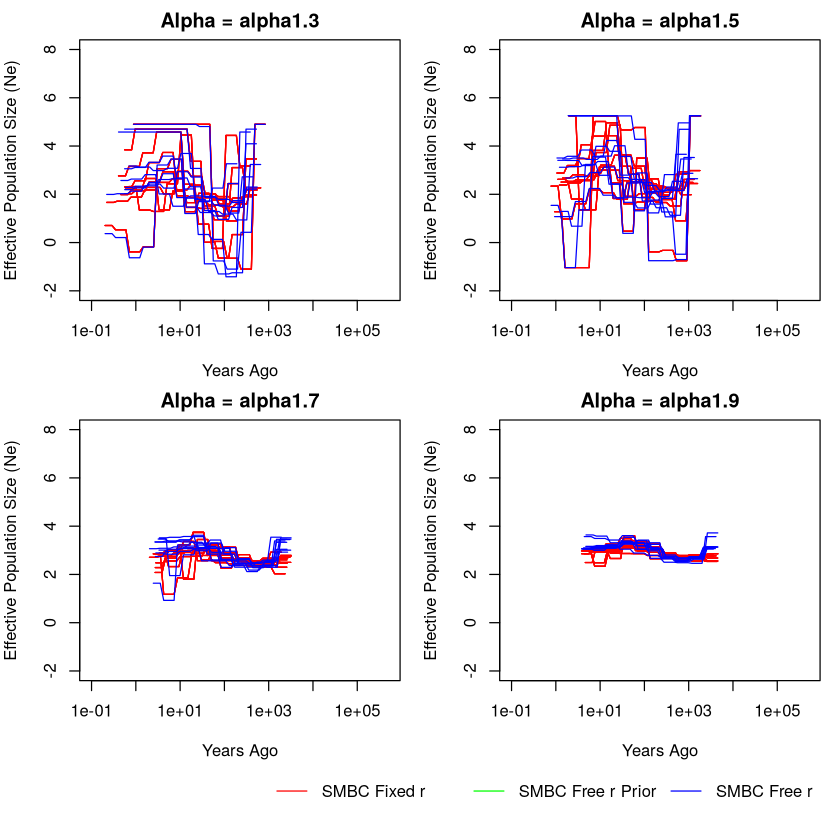

In [12]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(0.1, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_06$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_06$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_06$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_06$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_06$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_06$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago, df_free$Ne, type = "l", col = "blue")
    }
  }

}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))

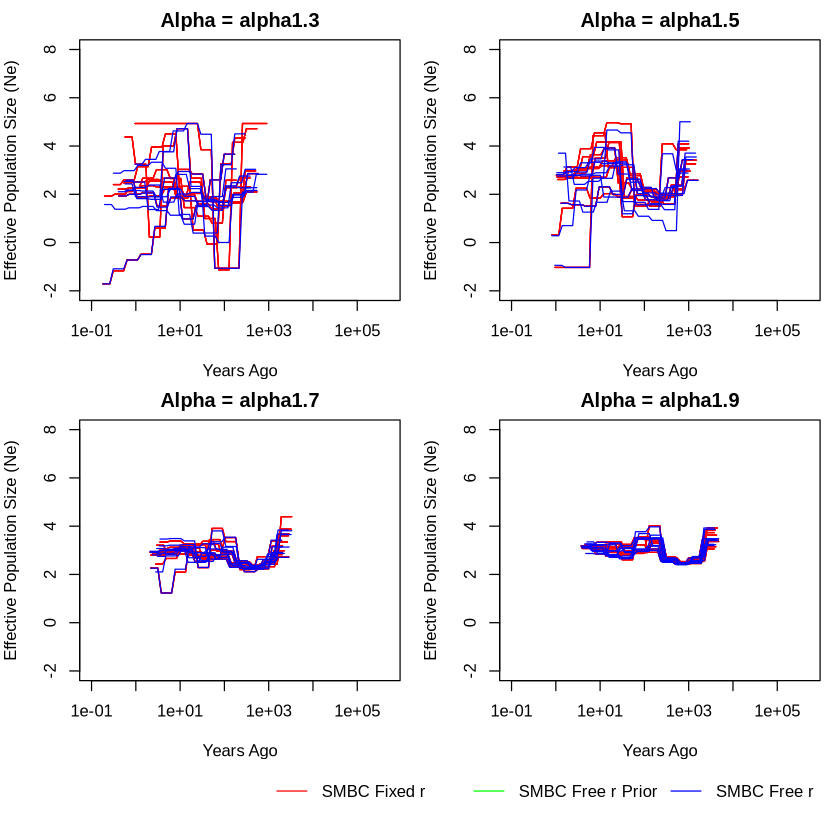

In [42]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(0.1, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_07$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_07$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_07$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_07$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_07$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_07$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago, df_free$Ne, type = "l", col = "blue")
    }
  }

}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))

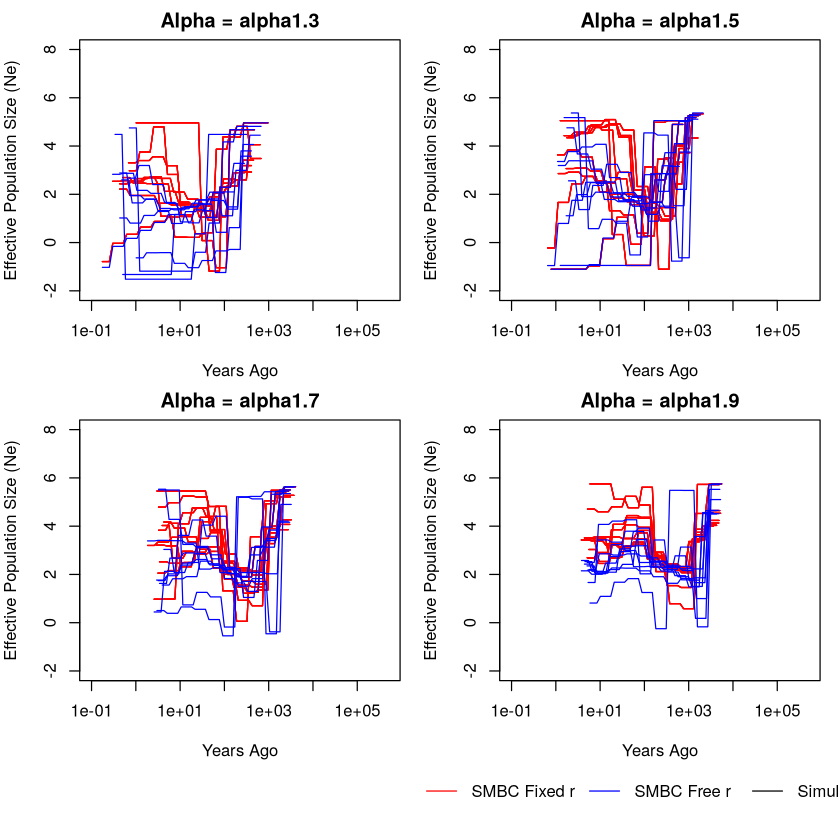

In [15]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(0.1, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_08$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_08$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_08$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_08$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_08$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_08$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago, df_free$Ne, type = "l", col = "blue")
    }
  }

}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r",  "SMBC Free r", "Simulation"),
       col = c("red", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))

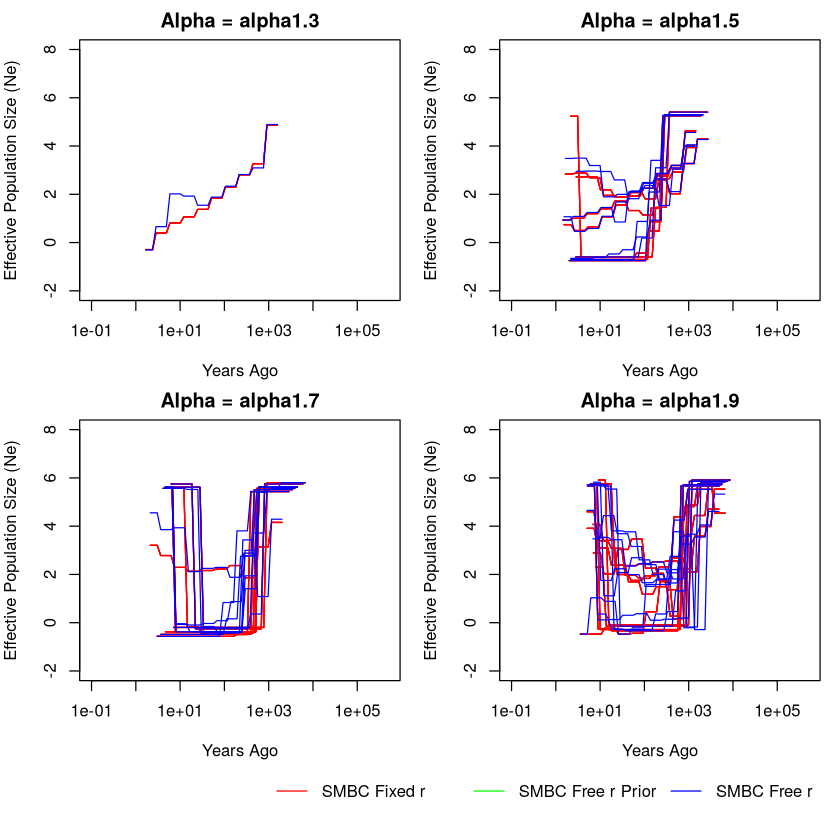

In [13]:
# Set up a 2x2 layout for 4 panels with space for a shared legend
par(mfrow = c(2, 2), mar = c(4, 4, 2, 1), oma = c(4, 0, 0, 0), bg = "white")

# Loop over each alpha to create a separate panel
for (alpha in alphas) {
  # Create an empty plot for this alpha
  plot(NULL, xlim = c(0.1, 500000), ylim = c(-2, 8),
       log = "x", # Log-transform the x-axis
       xlab = "Years Ago", ylab = "Effective Population Size (Ne)",
       main = paste("Alpha =", alpha), col = "blue")
  
  # Plot data from smbc_fixed_r
  for (group_name in names(individual_data_frames_m1e_09$smbc_fixed_r)) {
    # Extract the data frame and filter by alpha
    df_fixed <- individual_data_frames_m1e_09$smbc_fixed_r[[group_name]]
    if (df_fixed$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_fixed$years_ago, df_fixed$Ne, type = "l", col = "red")
    }
  }
  
  # Plot data from smbc_free_r_prior
  for (group_name in names(individual_data_frames_m1e_09$smbc_free_r_prior)) {
    # Extract the data frame and filter by alpha
    df_free_prior <- individual_data_frames_m1e_09$smbc_free_r_prior[[group_name]]
    if (df_free_prior$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free_prior$years_ago, df_free_prior$Ne, type = "l", col = "green")
    }
  }
  
  # Plot data from smbc_free_r
  for (group_name in names(individual_data_frames_m1e_09$smbc_free_r)) {
    # Extract the data frame and filter by alpha
    df_free <- individual_data_frames_m1e_09$smbc_free_r[[group_name]]
    if (df_free$alpha_sim[1] == alpha) {
      # Add the line for this group
      lines(df_free$years_ago, df_free$Ne, type = "l", col = "blue")
    }
  }

}

# Add a single legend below the entire panel
par(xpd = NA)  # Allow drawing outside the plot region
legend("bottom", inset = c(0.2, -0.5), legend = c("SMBC Fixed r", "SMBC Free r Prior", "SMBC Free r", "Simulation"),
       col = c("red", "green", "blue", "black"), lty = c(1, 1, 1, 1), lwd = c(1, 1, 1, 2), horiz = TRUE, bty = "n")

# Reset plotting parameters to default
par(mfrow = c(2, 2), bg = "white", oma = c(0, 0, 0, 0))

In [50]:
# List of mutation rates and corresponding data frames
mutation_rates <- c("m1e_06","m1e_07", "m1e_08","m1e_09")

# Create an empty data frame to store all the data for plotting
all_data <- data.frame()

# Define different y-limits for each facet (mutation rate)
y_limits_list <- list(
  "m1e_7" = c(0, 3),
  "m1e_8" = c(0, 500),
  "m1e_09" = c(0, 1000)
)

# Loop through each mutation rate and process the data
for (mutation_rate in mutation_rates) {
  
  # Extract the corresponding mutation data (using the assigned variable names)
  mutation_data <- get(paste0("individual_data_frames_", mutation_rate))
  
  # Define the models to process: esmc2_free and beta_dir
  models <- c("smbc_fixed_r", "smbc_free_r")
  
  # Loop through each model and process its data
  for (model in models) {
    
    # Extract the model-specific data
    df <- mutation_data[[model]]
    
    # Check if there are any data for the model
    if (length(df) > 0) {
      # Add the mutation rate, replicate, and model info
      model_data <- bind_rows(lapply(names(df), function(rep_name) {
        data <- df[[rep_name]]
        data %>%
          mutate(
            Model = model,                  # Set model name dynamically
            MutationRate = mutation_rate,  # Add mutation rate
            Replicate = rep_name           # Add replicate name
          )
      }))
      
      # Combine model data with the all_data data frame
      all_data <- bind_rows(all_data, model_data)
    }
  }
}

# Modify the 'alpha_sim' column to remove "alpha" and keep only the numbers
all_data$alpha_sim <- gsub("alpha_", "", all_data$alpha_sim)  # Remove 'alpha_' from the label
all_data$alpha_sim <- factor(all_data$alpha_sim, levels = sort(unique(all_data$alpha_sim)))  # Sort alphas in ascending order

# Ensure MutationRate is a factor with levels in the desired order
all_data$MutationRate <- factor(all_data$MutationRate, levels = mutation_rates)

# View the structure of the data
print(all_data)

        years_ago alpha_inf          Ne alpha_sim        r_m        Model
1       0.0000000     1.100  3.84355199  alpha1.3 0.10000000 smbc_fixed_r
2       0.5605912     1.100  3.84355199  alpha1.3 0.10000000 smbc_fixed_r
3       0.6712939     1.100  3.84355199  alpha1.3 0.10000000 smbc_fixed_r
4       0.8038575     1.100  3.84355199  alpha1.3 0.10000000 smbc_fixed_r
5       0.9625991     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
6       1.1526882     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
7       1.3803151     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
8       1.6528925     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
9       1.9792971     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
10      2.3701584     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
11      2.8382050     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
12      3.3986790     1.100  4.69989497  alpha1.3 0.10000000 smbc_fixed_r
13      4.0698324     1.100  4.6998949

In [45]:
mu=1e-8
for L in [10**7]:#
    for r in [1]:
        r=mu*r
        for alpha in [1.9,1.7]:
            Ne=10**6
            demography=msprime.Demography()
            demography.add_population(initial_size=(Ne))
            for x in range(1,11):
                #ts=msprime.DemographyDebugger(demography=demography,model=msprime.BetaCoalescent(alpha=alpha))
                #ts.print_history()
                ts=msprime.sim_ancestry(samples=sample_size,recombination_rate=r,sequence_length=L,demography=demography,ploidy=1 ,model=msprime.BetaCoalescent(alpha=alpha),random_seed=((alpha*x+1)**2))
                mts = msprime.sim_mutations(ts, rate=mu)
                f = open("Tutorial_5_D_alpha"+str(alpha)+"mu"+str(mu)+'r'+str(r)+'x'+str(x)+'L'+str(L)+".txt","w")
                for variant in mts.variants():
                    f.write(str(variant.site.position)+str(variant.genotypes)+'\n')
                f.close()

ERROR: Error in parse(text = input): <text>:2:5: unexpected symbol
1: mu=1e-8
2: for L
       ^


In [51]:
all_data_unique <- all_data %>%
  group_by(Replicate, Model, MutationRate) %>%  # Group by Replicate and MutationRate
  slice_head(n = 1) %>%                  # Select the first row in each group
  ungroup()     
head(all_data_unique)


years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<fct>,<chr>,<dbl>,<dbl>
0,1.300,1.2807080,alpha1.5,0.1,smbc_fixed_r,m1e_06,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-06r1e-07ratio0.1x9L10000000.txt.rds,NA,NA
0,1.300,-1.0313776,alpha1.5,1.0,smbc_fixed_r,m1e_07,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-07r1e-07ratio1.0x9L10000000.txt.rds,NA,NA
0,1.999,3.2148925,alpha1.7,10.0,smbc_fixed_r,m1e_08,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07ratio10.0x2L10000000.txt.rds,NA,NA
0,1.100,-0.4843078,alpha1.7,100.0,smbc_fixed_r,m1e_09,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07ratio99.99999999999999x3L10000000.txt.rds,NA,NA
0,1.650,2.8417701,alpha1.7,0.1,smbc_fixed_r,m1e_06,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-06r1e-07ratio0.1x10L10000000.txt.rds,NA,NA
0,1.999,2.7963115,alpha1.7,1.0,smbc_fixed_r,m1e_07,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07ratio1.0x10L10000000.txt.rds,NA,NA


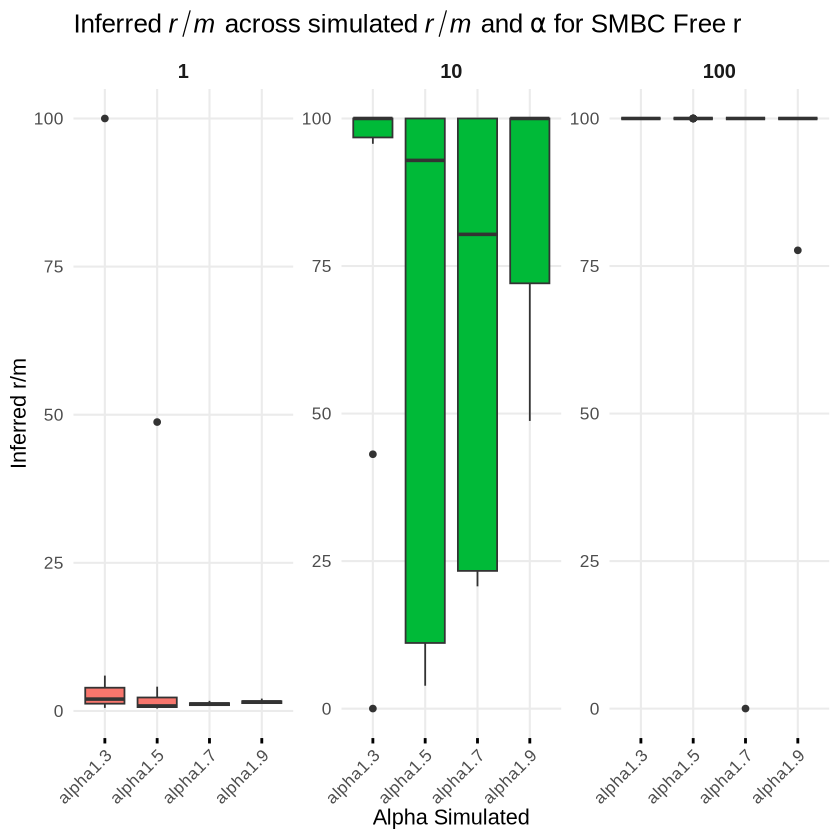

In [48]:
# Define custom labels for each mutation rate
mutation_rate_labels <- c(
  "m1e_06" = "0.1", 
  "m1e_07" = "1", 
  "m1e_08" = "10",
  "m1e_09"= "100"
)

# Define custom labels for models
model_labels <- c(
  "smbc_free_r" = "SMBC Free r",
  "smbc_fixed_r" = "SMBC Fixed r"
)

# Convert MutationRate and Model to factors with levels in the desired order
all_data_unique$MutationRate <- factor(
  all_data_unique$MutationRate,
  levels = names(mutation_rate_labels)  # Use the order defined in mutation_rate_labels
)

all_data_unique$Model <- factor(
  trimws(all_data_unique$Model),  # Remove any extra spaces
  levels = names(model_labels)  # Use the order defined in model_labels
)

# Convert alpha_sim to a factor and define its order (optional)
all_data_unique$alpha_sim <- factor(
  all_data_unique$alpha_sim, 
  levels = sort(unique(all_data_unique$alpha_sim))  # Automatically orders by unique values
)

# Remove duplicate rows: Keep the first row for each combination of Replicate, Model, and MutationRate
all_data_unique <- all_data %>%
  group_by(Replicate, Model, MutationRate) %>%
  slice_head(n = 1) %>%
  ungroup()

# Function to generate the plot for a single model
create_plot <- function(data, model_name) {
  ggplot(data, aes(x = alpha_sim, y = r_m, fill = MutationRate)) +
    geom_boxplot() +  
    facet_wrap(
      ~ MutationRate, 
      scales = "free_y", 
      nrow = 1,
      labeller = labeller(MutationRate = mutation_rate_labels)
    ) +
    labs(
      x = "Alpha Simulated",
      y = "Inferred r/m",
      fill = "Mutation Rate",
      title = bquote("Inferred " * italic(r/m) * " across simulated " * italic(r/m) * " and " * alpha * " for " * .(model_name))
    ) +
    scale_x_discrete(labels = levels(data$alpha_sim)) +  # Use factor levels for x-axis labels
    theme_minimal(base_size = 13) +
    theme(
      strip.text = element_text(size = 12, face = "bold"),
      legend.position = "none",  # No individual legends
      panel.grid.minor = element_blank(),
      axis.text.x = element_text(angle = 45, hjust = 1),
      axis.ticks.x = element_line(size = 0.8),
      strip.background = element_blank()
    )
}

# Create separate plots for each model
plot_esmc2_fixed <- create_plot(subset(all_data_unique, Model == "smbc_fixed_r"), model_labels["smbc_fixed_r"])
plot_esmc2_free <- create_plot(subset(all_data_unique, Model == "smbc_free_r"), model_labels["smbc_free_r"])

plot_esmc2_free

In [52]:
all_data_unique$Model <- factor(
  all_data_unique$Model,
  levels = names(model_labels)  # Use the order defined in model_labels
)

head(all_data_unique)

years_ago,alpha_inf,Ne,alpha_sim,r_m,Model,MutationRate,Replicate,rho,mu
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<chr>,<dbl>,<dbl>
0,1.300,1.2807080,alpha1.5,0.1,smbc_fixed_r,m1e_06,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-06r1e-07ratio0.1x9L10000000.txt.rds,NA,NA
0,1.300,-1.0313776,alpha1.5,1.0,smbc_fixed_r,m1e_07,100_alpha1.5_Tutorial_5_D_alpha1.5mu1e-07r1e-07ratio1.0x9L10000000.txt.rds,NA,NA
0,1.999,3.2148925,alpha1.7,10.0,smbc_fixed_r,m1e_08,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-08r1e-07ratio10.0x2L10000000.txt.rds,NA,NA
0,1.100,-0.4843078,alpha1.7,100.0,smbc_fixed_r,m1e_09,100_alpha1.7_Tutorial_5_D_alpha1.7mu1e-09r1e-07ratio99.99999999999999x3L10000000.txt.rds,NA,NA
0,1.650,2.8417701,alpha1.7,0.1,smbc_fixed_r,m1e_06,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-06r1e-07ratio0.1x10L10000000.txt.rds,NA,NA
0,1.999,2.7963115,alpha1.7,1.0,smbc_fixed_r,m1e_07,101_alpha1.7_Tutorial_5_D_alpha1.7mu1e-07r1e-07ratio1.0x10L10000000.txt.rds,NA,NA


In [53]:
# Convert MutationRate and Model to factors with levels in the desired order
all_data_unique$MutationRate <- factor(
  all_data_unique$MutationRate,
  levels = names(mutation_rate_labels)  # Use the order defined in mutation_rate_labels
)


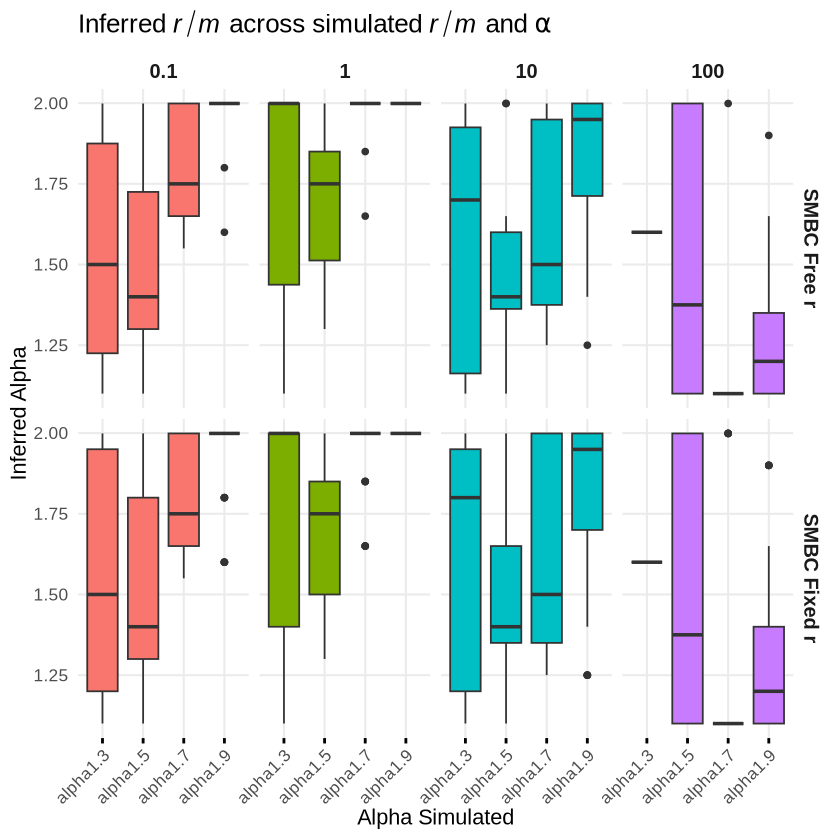

In [54]:
# Convert alpha_sim to a factor for proper ordering
all_data_unique$alpha_sim <- factor(
  all_data_unique$alpha_sim,
  levels = sort(unique(all_data_unique$alpha_sim))  # Automatically ordered
)

# Create the plot
ggplot(all_data_unique, aes(x = alpha_sim, y = alpha_inf, fill = MutationRate)) +
  geom_boxplot() +  
  facet_grid(Model ~ MutationRate, scales = "free_y", 
             labeller = labeller(
               MutationRate = mutation_rate_labels,  # Custom mutation rate labels
               Model = model_labels                 # Custom model labels
             )) +
  labs(
    x = "Alpha Simulated",
    y = "Inferred Alpha",
    fill = "Mutation Rate",
    title = bquote("Inferred " * italic(r/m) * " across simulated " * italic(r/m) * " and " * alpha)  # Fixed title
  ) +
  scale_x_discrete(labels = levels(all_data_unique$alpha_sim)) +  # Use factor levels for x-axis labels
  theme_minimal(base_size = 13) +
  theme(
    strip.text = element_text(size = 12, face = "bold"),  # Facet labels
    legend.position = "none",  # Turn off legend if not needed
    panel.grid.minor = element_blank(),  # Remove minor grid lines
    axis.text.x = element_text(angle = 45, hjust = 1),  # Rotate x-axis labels for better readability
    axis.ticks.x = element_line(size = 0.8),  # Add ticks to x-axis with size
    strip.background = element_blank()  # Remove background from strip text
  )